# FYP ICT3909 - Yolo Metrics and Visualisation
---

**Name:** Andrea Filiberto Lucas  
**ID No:** 0279704L

---

In [1]:
import os
import json
import subprocess
import importlib.util
import importlib

# Define coloured terminal output for status messages
COLORS = {
    "green": "\033[92m",  # Green
    "red": "\033[91m",    # Red
    "reset": "\033[0m"    # Reset
}

# Path to the JSON file listing required libraries
LIB_FILE_PATH = os.path.join("..", "Other", "Libraries", "Metrics&Visual.json")

def load_library_list(path):
    """Load the list of required libraries from a JSON file."""
    try:
        with open(path, 'r') as file:
            return json.load(file)
    except FileNotFoundError:
        print(f"{COLORS['red']}Error: Library file not found at {path}{COLORS['reset']}")
        exit(1)
    except json.JSONDecodeError:
        print(f"{COLORS['red']}Error: Failed to decode JSON from the library file.{COLORS['reset']}")
        exit(1)

def is_library_installed(module_name):
    """Check if a Python module is installed."""
    return importlib.util.find_spec(module_name) is not None

def install_library(pip_name):
    """Attempt to install a library using pip."""
    try:
        subprocess.check_call(["pip", "install", pip_name])
        return True
    except subprocess.CalledProcessError:
        return False

def check_and_install_libraries(lib_map):
    """Check and install missing libraries."""
    for pip_name, import_name in lib_map.items():
        if is_library_installed(import_name):
            print(f"[{COLORS['green']}✔{COLORS['reset']}] Library '{pip_name}' is already installed.")
        else:
            print(f"[{COLORS['red']}✖{COLORS['reset']}] Library '{pip_name}' is not installed. Installing...")
            if install_library(pip_name):
                print(f"[{COLORS['green']}✔{COLORS['reset']}] Successfully installed '{pip_name}'.")
            else:
                print(f"[{COLORS['red']}✖{COLORS['reset']}] Failed to install '{pip_name}'. Please install it manually.")

# Load the list of libraries and check them
libraries = load_library_list(LIB_FILE_PATH)
check_and_install_libraries(libraries)

# ---- LIBRARIES USED IN PROJECT ----

# Standard Libraries
from concurrent.futures import ThreadPoolExecutor, as_completed

# Data and Visualisation
import pandas as pd              # type: ignore
import numpy as np               # type: ignore
import matplotlib.pyplot as plt  # type: ignore
import matplotlib.patches as patches  # type: ignore
import seaborn as sns            # type: ignore

# Computer Vision and ML
import cv2                       # type: ignore
import torch                     # type: ignore
from ultralytics import YOLO     # type: ignore

# Display tools for Jupyter & Other
from IPython.display import Image, display  # type: ignore
import random
from torchvision.transforms import ToTensor

[✔] Library 'pandas' is already installed.
[✔] Library 'numpy' is already installed.
[✔] Library 'matplotlib' is already installed.
[✔] Library 'seaborn' is already installed.
[✔] Library 'opencv-python' is already installed.
[✔] Library 'ultralytics' is already installed.
[✔] Library 'ipython' is already installed.


## Determine the Available Device for Computation

This function identifies and selects the best available device for running deep learning models, prioritizing hardware acceleration via CUDA (GPU) or MPS (Metal Performance Shaders). If no hardware acceleration is available, it defaults to the CPU and notifies the user.

In [2]:
# Determine the available device: CUDA, MPS, or CPU.
def determine_device():
    if torch.cuda.is_available():
        device = "cuda"
        print(f"Using GPU: {torch.cuda.get_device_name(0)}")
    elif torch.backends.mps.is_available():
        device = "mps"
        print("Using MPS (Metal Performance Shaders) for acceleration.")
    else:
        device = "cpu"
        print("Using CPU. Consider enabling GPU or MPS for faster training.")
    return device

## Results

### Ultralytics Results 

This script facilitates the selection and evaluation of YOLO detection results stored in the `runs/detect` directory. It identifies folders ending with "R," lets the user choose one, and displays evaluation images within the selected folder (excluding "val_batch" files). Additionally, it checks the corresponding "non-R" folder for a `results.png` file and displays it if found.

Available versions:

YOLOV12:
1. NGD-Yolov12_v1
2. NGD-Yolov12_v2
3. NGD-Yolov12_v3
4. NGD-Yolov12_v4
5. NGD-Yolov12_v5

YOLOV8:
6. NGD-Yolov8_v1

Found evaluation folder: NGD-Yolov12_v5R


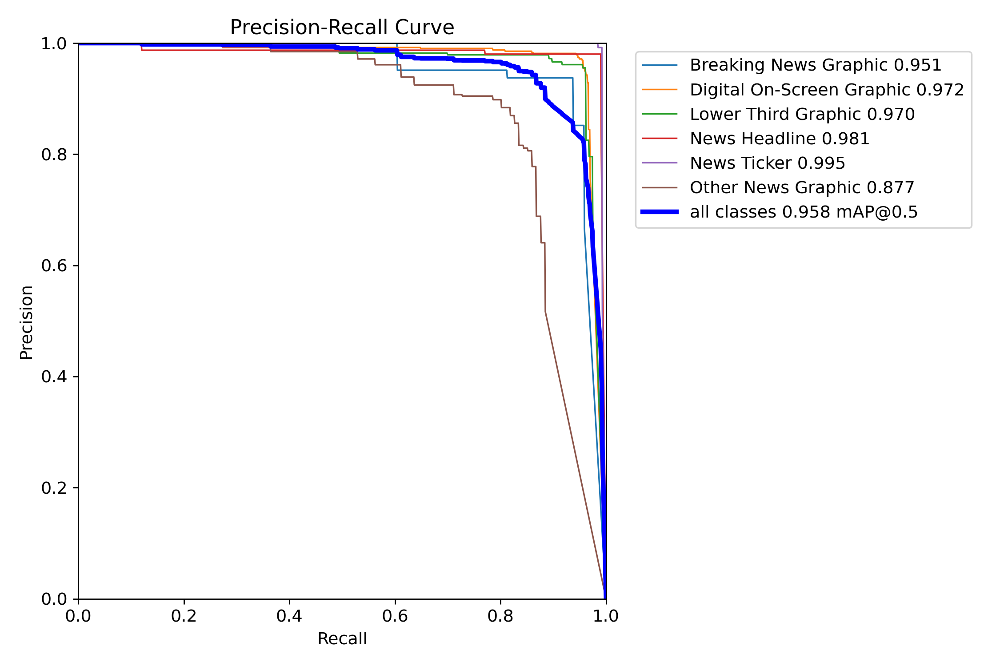

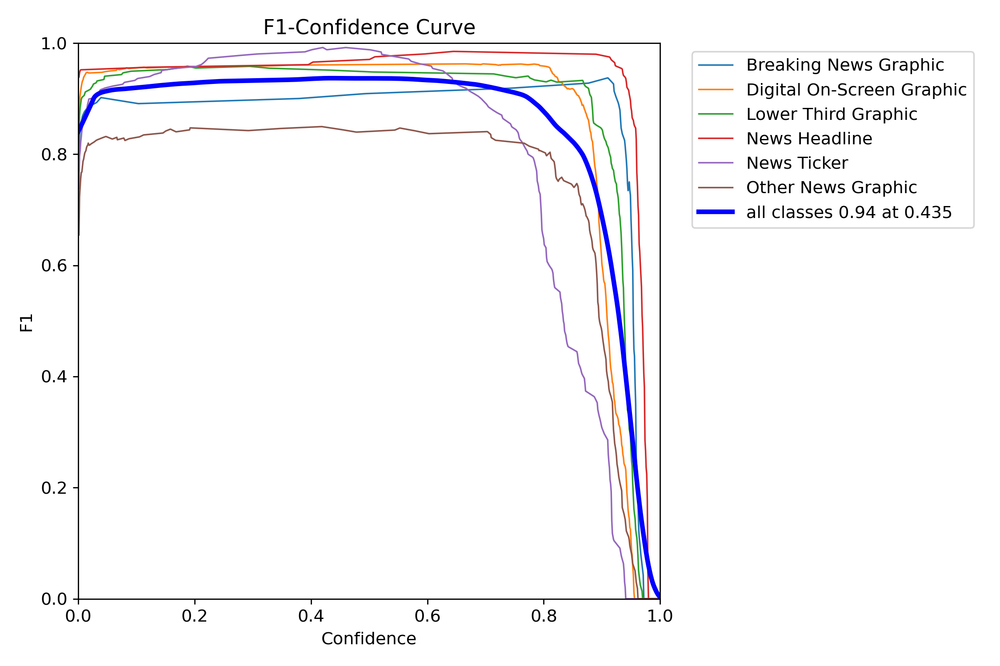

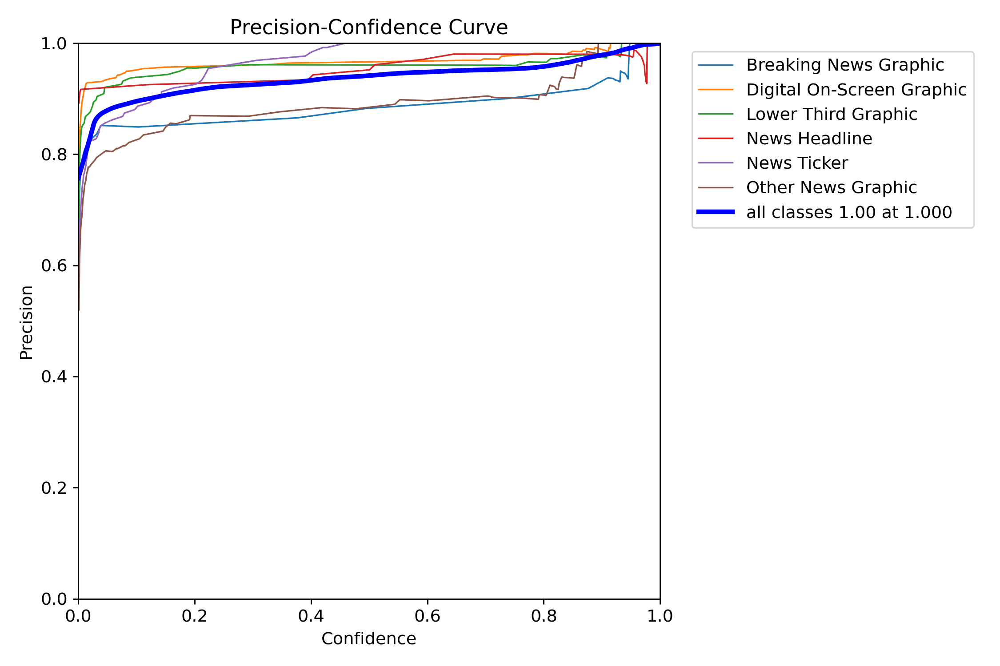

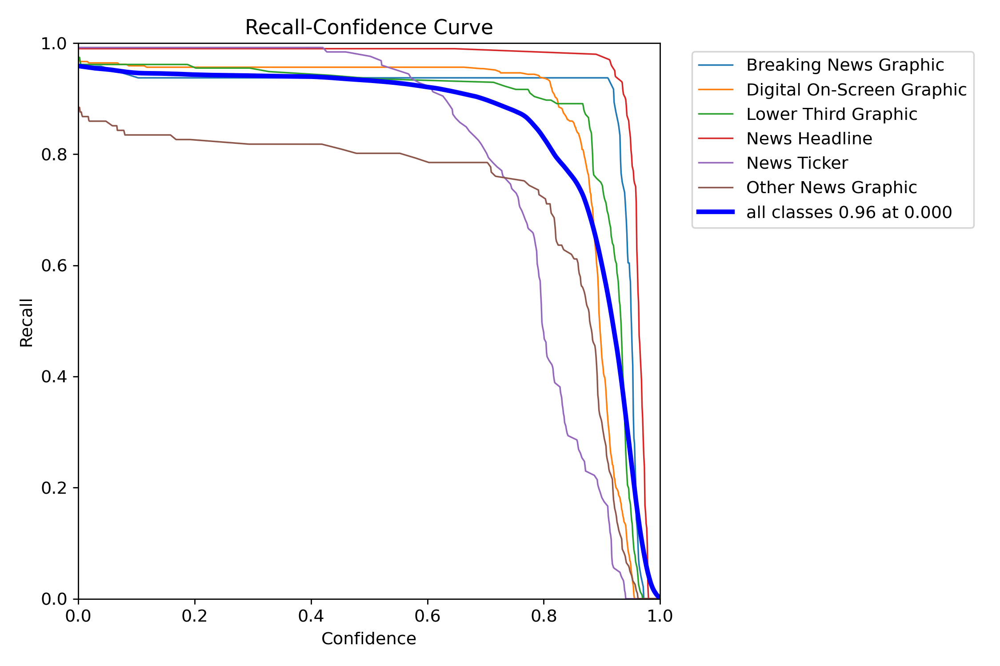

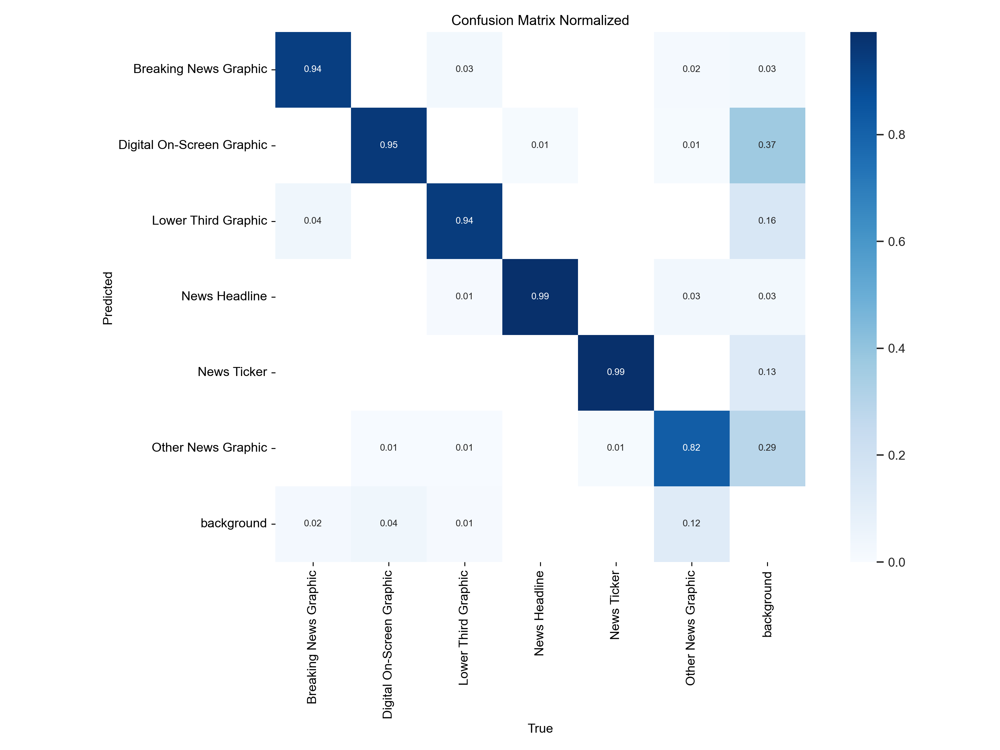

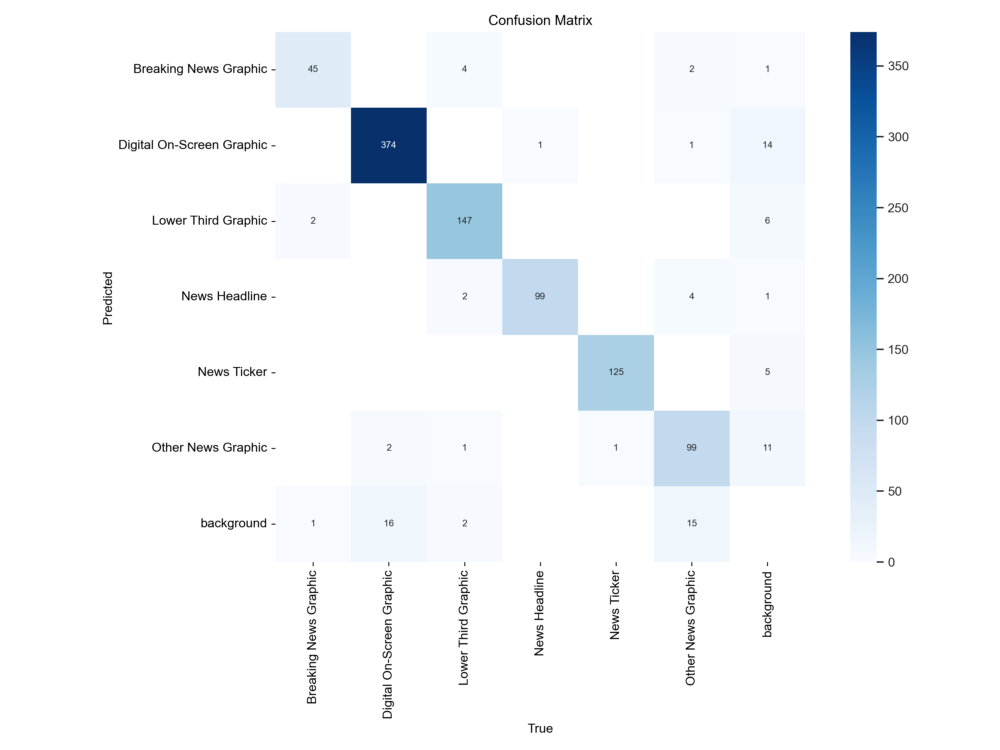

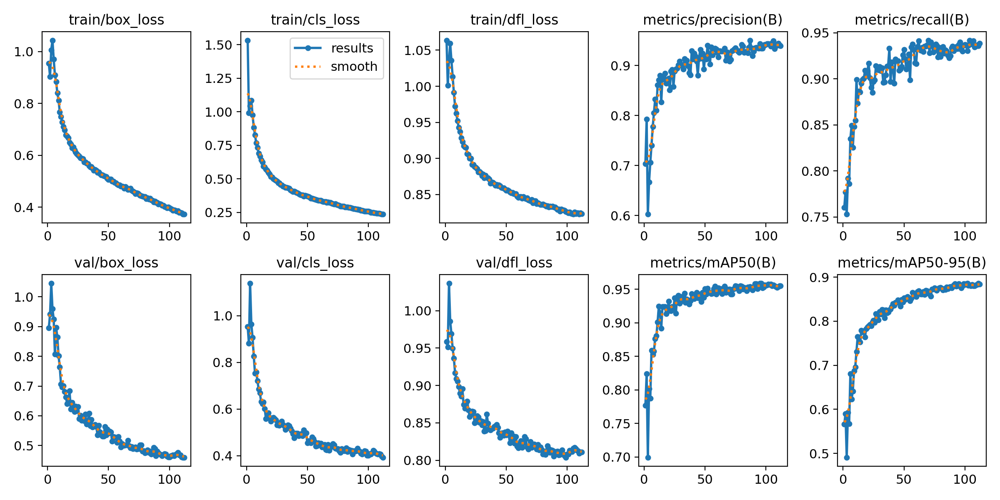

In [3]:
import os
import re
from collections import defaultdict
from IPython.display import Image, display

# Define the detect path
detect_path = os.path.join(os.getcwd(), "runs", "detect")

# Step 1: Get all valid version folders (exclude ones ending in 'R')
version_folders = [
    folder for folder in os.listdir(detect_path)
    if os.path.isdir(os.path.join(detect_path, folder)) and not folder.endswith("R")
]

# Step 2: Dynamically group by model type using regex
model_groups = defaultdict(list)
pattern = re.compile(r"NGD-([A-Za-z0-9]+)_v\d+", re.IGNORECASE)

for folder in version_folders:
    match = pattern.search(folder)
    model_type = match.group(1) if match else "Uncategorised"
    model_groups[model_type].append(folder)

# Step 3: Display grouped models with unified indexing
print("Available versions:")
indexed_versions = []
counter = 1

for model_type in sorted(model_groups.keys()):
    print(f"\n{model_type.upper()}:")
    for version in sorted(model_groups[model_type]):
        print(f"{counter}. {version}")
        indexed_versions.append(version)
        counter += 1

# Prompt user to select a version
try:
    selected_index = int(input("\nEnter the number of the version you want to test: ")) - 1
    if selected_index < 0 or selected_index >= len(indexed_versions):
        raise ValueError("Invalid selection.")
except ValueError:
    raise ValueError("Invalid input. Please enter a valid number.")

# Selected version and corresponding weights path
selected_version = indexed_versions[selected_index]
weights_path = os.path.join(detect_path, selected_version, "weights", "best.pt")

if not os.path.exists(weights_path):
    raise FileNotFoundError(f"Weights file not found: {weights_path}")

# Step 4: Find and display evaluation folder (version + 'R')
selected_r_folder = selected_version + "R"
eval_folder_path = os.path.join(detect_path, selected_r_folder)

if not os.path.exists(eval_folder_path):
    print(f"\nNo corresponding 'R' folder found for {selected_version}")
else:
    print(f"\nFound evaluation folder: {selected_r_folder}")
    
    evaluation_images = [
        img for img in os.listdir(eval_folder_path)
        if img.lower().endswith(('.png', '.jpg')) and "val_batch" not in img
    ]

    if not evaluation_images:
        print("No evaluation images found in the selected folder.")
    else:
        for img_file in evaluation_images:
            img_path = os.path.join(eval_folder_path, img_file)
            display(Image(filename=img_path))

# Step 5: Display results.png from the original folder
results_png_path = os.path.join(detect_path, selected_version, "results.png")
if os.path.exists(results_png_path):
    display(Image(filename=results_png_path))
else:
    print("No results.png found in the selected version folder.")


### Code-based Metrics (Table Format)

This script analyzes the training and validation metrics for a selected YOLOv8 version. It reads the `results.csv` file from the specified version's folder, calculates averages for key metrics (e.g., precision, recall, mAP@50, mAP@50-95, and loss values), and displays both the final epoch values and their averages in a structured table. The script ensures robust error handling to manage missing files or invalid paths.

In [4]:
# Path to the selected version's folder
selected_version_path = os.path.join(detect_path, selected_version)

# Path to results CSV file
results_csv_path = os.path.join(selected_version_path, "results.csv")

# Ensure the file exists
if not os.path.exists(results_csv_path):
    raise FileNotFoundError(f"'results.csv' not found in the selected version: {selected_version_path}")

# Load the CSV file
results_df = pd.read_csv(results_csv_path)

# Compute averages for all metrics and losses
average_metrics = {
    "Metric": [
        "Precision", "Recall", "mAP@50", "mAP@50-95", 
        "Train Box Loss", "Train Classification Loss", 
        "Validation Box Loss", "Validation Classification Loss"
    ],
    "Final Value": [
        results_df['metrics/precision(B)'].iloc[-1],
        results_df['metrics/recall(B)'].iloc[-1],
        results_df['metrics/mAP50(B)'].iloc[-1],
        results_df['metrics/mAP50-95(B)'].iloc[-1],
        results_df['train/box_loss'].iloc[-1],
        results_df['train/cls_loss'].iloc[-1],
        results_df['val/box_loss'].iloc[-1],
        results_df['val/cls_loss'].iloc[-1]
    ],
    "Average Value": [
        results_df['metrics/precision(B)'].mean(),
        results_df['metrics/recall(B)'].mean(),
        results_df['metrics/mAP50(B)'].mean(),
        results_df['metrics/mAP50-95(B)'].mean(),
        results_df['train/box_loss'].mean(),
        results_df['train/cls_loss'].mean(),
        results_df['val/box_loss'].mean(),
        results_df['val/cls_loss'].mean()
    ]
}

# Convert metrics dictionary to DataFrame
metrics_df = pd.DataFrame(average_metrics)

# Display the title and the table
print(f"📊 YOLO Model Training & Validation Metrics for Version: {selected_version}")
display(metrics_df)

📊 YOLO Model Training & Validation Metrics for Version: NGD-Yolov12_v5


,Metric,Final Value,Average Value
0,Precision,0.93969,0.901291
1,Recall,0.93858,0.911509
2,mAP@50,0.95525,0.932437
3,mAP@50-95,0.88418,0.826509
4,Train Box Loss,0.37268,0.533553
5,Train Classification Loss,0.23554,0.413992
6,Validation Box Loss,0.46033,0.563462
7,Validation Classification Loss,0.39272,0.504757


### F1 Score Over Epochs

This section calculates the F1 Score using the model’s precision and recall values across all epochs. It shows the final and average F1 Score, and plots how it changes over time to evaluate the model’s balance between precision and recall.

Final F1 Score: 0.9391
Mean F1 Score across epochs: 0.9061


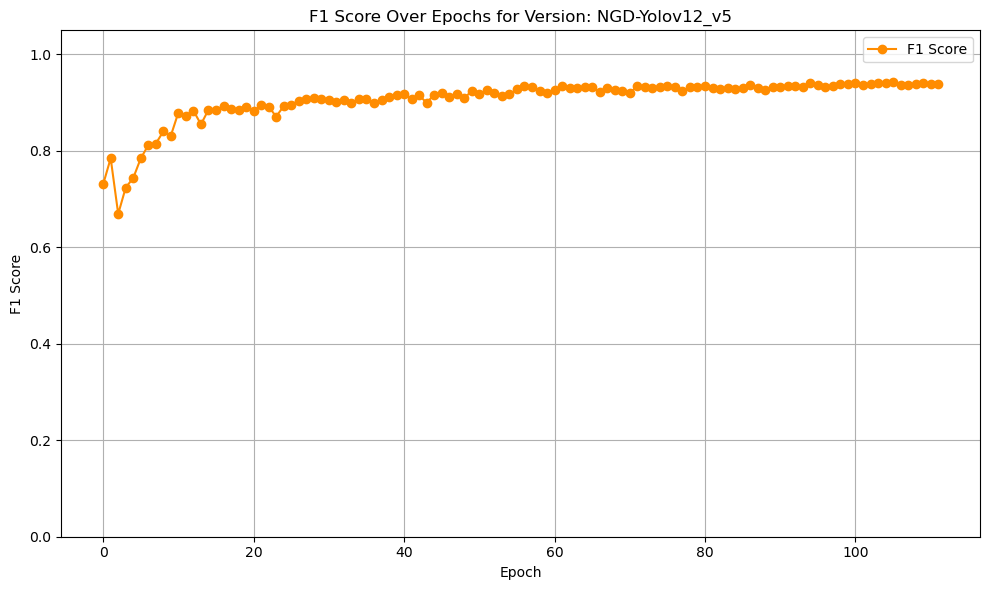

In [5]:
# Extract precision and recall across all epochs
precision_series = results_df['metrics/precision(B)']
recall_series = results_df['metrics/recall(B)']

# Compute F1 Score per epoch
f1_series = 2 * (precision_series * recall_series) / (precision_series + recall_series)

# Final and Mean F1 Scores
final_f1 = f1_series.iloc[-1]
mean_f1 = f1_series.mean()

# Display in console
print(f"Final F1 Score: {final_f1:.4f}")
print(f"Mean F1 Score across epochs: {mean_f1:.4f}")

# Plot F1 Score over epochs
plt.figure(figsize=(10, 6))
plt.plot(f1_series.index, f1_series, label='F1 Score', color='darkorange', marker='o')
plt.title(f"F1 Score Over Epochs for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("F1 Score")
plt.ylim(0, 1.05)
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

### YOLO Metrics and Loss Visualization for Selected Version

This script reads the `results.csv` file from the selected YOLO version's folder and visualizes key metrics and losses over epochs. It plots Precision, Recall, mAP@50, and mAP@50-95 to assess the model's performance throughout training. Additionally, it visualizes the training and validation losses for box and classification tasks, helping to track the model’s convergence and potential overfitting. The plots are displayed with clear labels and legends for easy interpretation.

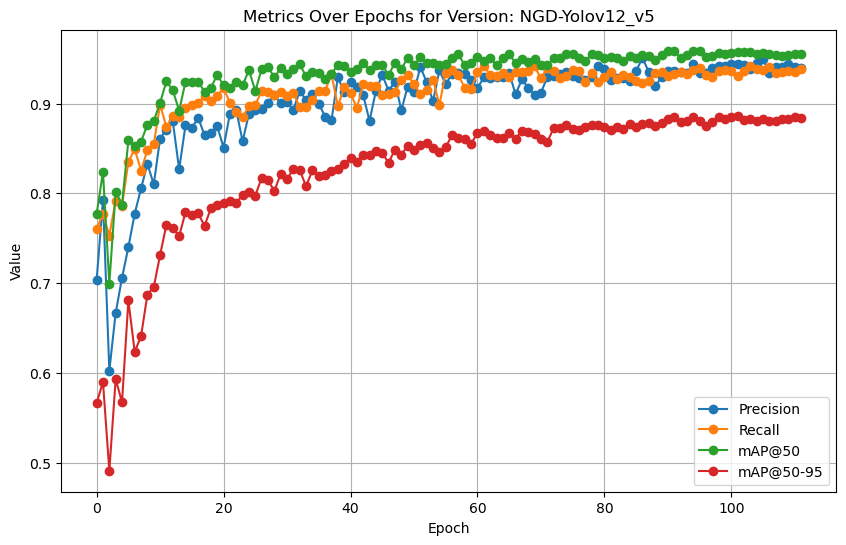

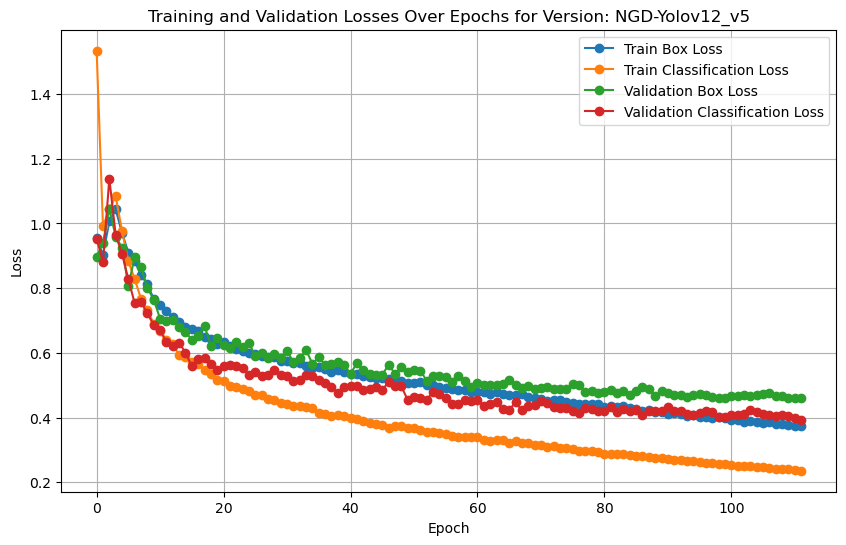

In [6]:
# Path to the selected version's folder
selected_version_path = os.path.join(detect_path, selected_version)

# Path to results CSV file
results_csv_path = os.path.join(selected_version_path, "results.csv")

# Ensure the file exists
if not os.path.exists(results_csv_path):
    raise FileNotFoundError(f"'results.csv' not found in the selected version: {selected_version_path}")

# Load the CSV file
results_df = pd.read_csv(results_csv_path)

# Plot Precision, Recall, mAP@50, and mAP@50-95 over epochs
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['metrics/precision(B)'], label='Precision', marker='o')
plt.plot(results_df.index, results_df['metrics/recall(B)'], label='Recall', marker='o')
plt.plot(results_df.index, results_df['metrics/mAP50(B)'], label='mAP@50', marker='o')
plt.plot(results_df.index, results_df['metrics/mAP50-95(B)'], label='mAP@50-95', marker='o')
plt.title(f"Metrics Over Epochs for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("Value")
plt.legend()
plt.grid(True)
plt.show()

# Plot Training and Validation Losses over epochs
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['train/box_loss'], label='Train Box Loss', marker='o')
plt.plot(results_df.index, results_df['train/cls_loss'], label='Train Classification Loss', marker='o')
plt.plot(results_df.index, results_df['val/box_loss'], label='Validation Box Loss', marker='o')
plt.plot(results_df.index, results_df['val/cls_loss'], label='Validation Classification Loss', marker='o')
plt.title(f"Training and Validation Losses Over Epochs for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)
plt.show()

### YOLO Learning Rate and Loss Visualization for Selected Version

This script reads the `results.csv` file from the selected YOLO version's folder and generates three visualizations. First, it plots the learning rate schedule for different parameter groups (`pg0`, `pg1`, `pg2`) over epochs. Second, it visualizes the breakdown of training losses, including box loss, classification loss, and DFL loss. Finally, a scatter plot shows the relationship between precision and recall across epochs, with color coding for epoch progression. These visualizations provide insight into the model’s learning rate adjustments, loss behavior, and performance trade-offs.

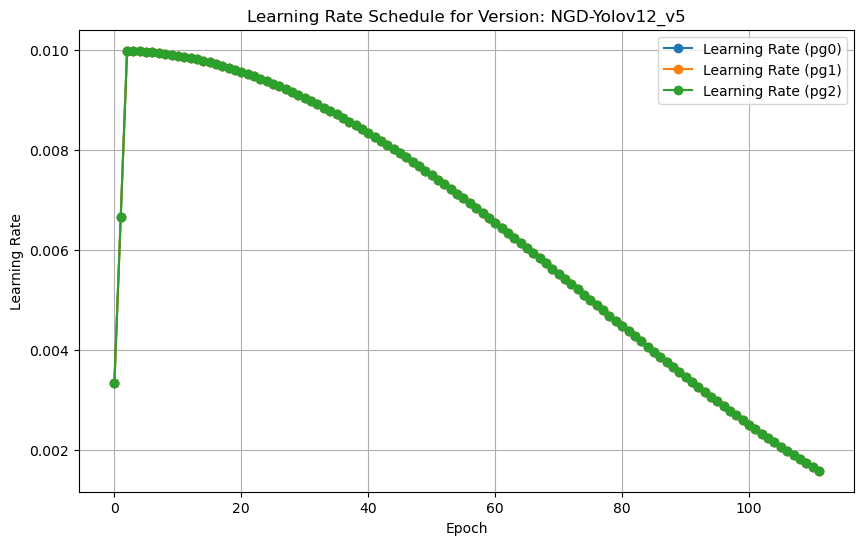

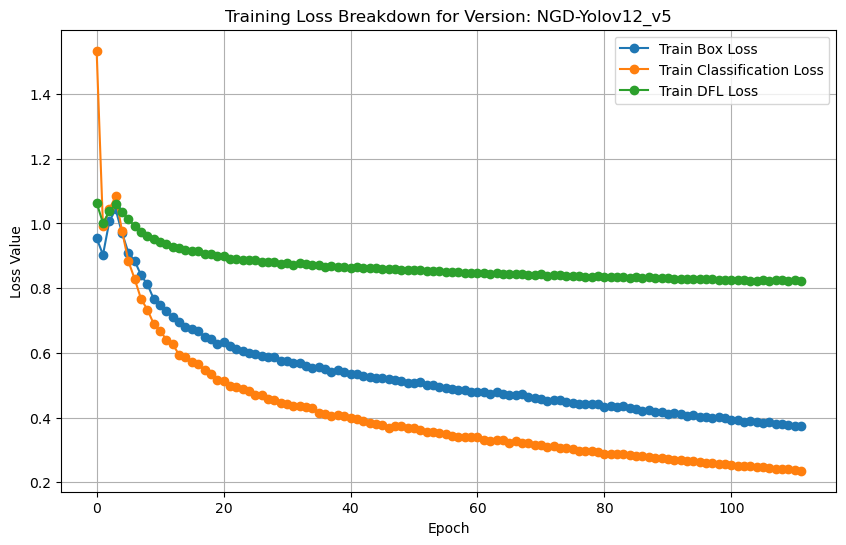

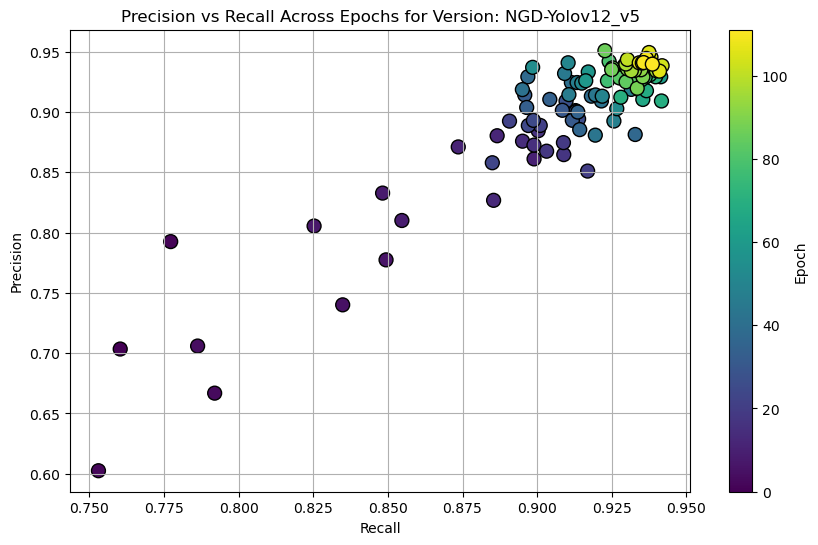

In [7]:
# Path to the selected version's folder
selected_version_path = os.path.join(detect_path, selected_version)

# Path to results CSV file
results_csv_path = os.path.join(selected_version_path, "results.csv")

# Ensure the file exists
if not os.path.exists(results_csv_path):
    raise FileNotFoundError(f"'results.csv' not found in the selected version: {selected_version_path}")

# Load the CSV file
results_df = pd.read_csv(results_csv_path)

# Plot Learning Rate Schedule
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['lr/pg0'], label='Learning Rate (pg0)', marker='o')
plt.plot(results_df.index, results_df['lr/pg1'], label='Learning Rate (pg1)', marker='o')
plt.plot(results_df.index, results_df['lr/pg2'], label='Learning Rate (pg2)', marker='o')
plt.title(f"Learning Rate Schedule for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("Learning Rate")
plt.legend()
plt.grid(True)
plt.show()

# Plot Loss Breakdown
plt.figure(figsize=(10, 6))
plt.plot(results_df.index, results_df['train/box_loss'], label='Train Box Loss', marker='o')
plt.plot(results_df.index, results_df['train/cls_loss'], label='Train Classification Loss', marker='o')
plt.plot(results_df.index, results_df['train/dfl_loss'], label='Train DFL Loss', marker='o')
plt.title(f"Training Loss Breakdown for Version: {selected_version}")
plt.xlabel("Epoch")
plt.ylabel("Loss Value")
plt.legend()
plt.grid(True)
plt.show()

# Plot Precision vs. Recall
plt.figure(figsize=(10, 6))
plt.scatter(results_df['metrics/recall(B)'], results_df['metrics/precision(B)'], c=results_df.index, cmap='viridis', s=100, edgecolor='k')
plt.colorbar(label="Epoch")
plt.title(f"Precision vs Recall Across Epochs for Version: {selected_version}")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.grid(True)
plt.show()

## Visualisation

### Image Processing Helper Functions

This script includes several functions for handling YOLO model loading, image processing, and visualization. The `load_model` function loads a YOLO model from a specified path, while the `load_image` function loads and converts an image to RGB format. The `ensure_rgb` function ensures that images are in the correct RGB format, handling grayscale and RGB/BGR images appropriately. 

In [8]:
# Load the model
def load_model(weights_path):
    if not os.path.exists(weights_path):
        raise FileNotFoundError(f"Weights file not found at {weights_path}.")
    return YOLO(weights_path)

# Load the image
def load_image(image_path):
    if not os.path.exists(image_path):
        raise FileNotFoundError(f"Image file not found at {image_path}.")
    image = cv2.imread(image_path)  # Load image in BGR format
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Ensure images are in RGB format
def ensure_rgb(image):
    if len(image.shape) == 3 and image.shape[2] == 3:  # Check if the image has 3 channels
        return cv2.cvtColor(image, cv2.COLOR_BGR2RGB) if not np.array_equal(
            image, cv2.cvtColor(cv2.cvtColor(image, cv2.COLOR_RGB2BGR), cv2.COLOR_BGR2RGB)
        ) else image
    elif len(image.shape) == 2:  # Grayscale image
        return cv2.cvtColor(image, cv2.COLOR_GRAY2RGB)  # Convert grayscale to RGB
    else:
        raise ValueError("Unsupported image format. Image must have 1 (grayscale) or 3 (RGB/BGR) channels.")

### Display Original and Predicted Images Side by Side

This function displays the **original image** and the **predicted image with bounding boxes** side by side. It filters out bounding boxes with confidence below a specified threshold, and the images are shown for easy comparison of the model’s predictions against the original input.

In [9]:
def display_images_side_by_side(original, predicted, results, confidence_threshold=0.35, titles=("Original Test Image", "Predicted Image with Bounding Boxes")):
    # Ensure both images are in RGB format
    original_rgb = ensure_rgb(original)

    # Filter results to exclude bounding boxes with confidence below threshold
    filtered_boxes = []
    boxes = results[0].boxes  # Access the bounding boxes from the results
    if boxes is not None:
        for box in boxes:
            x1, y1, x2, y2 = box.xyxy[0].tolist()  # Extract coordinates
            confidence = box.conf.item()           # Extract confidence as a scalar
            class_id = int(box.cls.item())         # Extract class ID as a scalar
            if confidence >= confidence_threshold:
                filtered_boxes.append((x1, y1, x2, y2, confidence, class_id))

    predicted_rgb = ensure_rgb(predicted)

    # Display images side by side
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title(titles[0])
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(predicted_rgb)
    plt.title(titles[1])
    plt.axis("off")
    plt.tight_layout()
    plt.show()

### Crop and Display Bounding Boxes in a Grid

This function crops the image based on detected bounding boxes with confidence above a specified threshold and displays them in a grid. Each cropped image is labeled with its class name and confidence score, allowing for easy inspection of individual detected objects.

In [ ]:
def crop_and_display_boxes_grouped(original_image, results, confidence_threshold=0.36):
    # Get bounding boxes and their corresponding class names
    boxes = results[0].boxes
    confidences = boxes.conf.cpu().numpy()
    class_ids = boxes.cls.cpu().numpy()

    # Initialize a list to store cropped images
    cropped_images = []
    cropped_titles = []

    # Loop through each bounding box and crop the region
    for i, (box, confidence, class_id) in enumerate(zip(boxes, confidences, class_ids)):
        if confidence >= confidence_threshold:
            # Get the coordinates of the bounding box
            x1, y1, x2, y2 = box.xyxy[0].tolist()
            
            # Crop the image around the bounding box
            cropped_image = original_image[int(y1):int(y2), int(x1):int(x2)]
            
            # Map class ID to class name
            class_name = model.names[int(class_id)]  # type: ignore

            # Store the cropped image and its title
            cropped_images.append(cropped_image)
            cropped_titles.append(f"{class_name} - Conf: {confidence:.2f}")

    # If there are cropped images, display them in a grid
    if cropped_images:
        num_images = len(cropped_images)
        grid_size = int(np.ceil(np.sqrt(num_images)))  # Calculate grid size for display

        # Plot cropped images in a grid
        plt.figure(figsize=(grid_size * 3, grid_size * 3))
        for i, (cropped_image, title) in enumerate(zip(cropped_images, cropped_titles)):
            plt.subplot(grid_size, grid_size, i + 1)
            plt.imshow(cropped_image)
            plt.title(title)
            plt.axis("off")
        plt.tight_layout()
        plt.show()

### Visual Analytics

This script defines a function `analyze_detections` that processes the results from a YOLO model, analyzing the detected objects in an image. It extracts bounding boxes, class IDs, and confidence scores, then maps the class IDs to class names using the model’s predefined classes. The function performs a breakdown of detected objects, displaying the total number and counts for specific classes, such as "Mixed Waste," "Organic Waste," "Other Waste," and "Recyclable Material."

The function also visualizes the analysis through two types of plots:
1. **Bar Chart**: Displays the count of detected objects per class, with color-coded bars for easy identification.
2. **Scatter Plot**: Plots confidence scores for each detection, color-coded by class, allowing for quick assessment of model certainty. These visualizations help in evaluating detection accuracy and confidence.

In [11]:
def analyze_detections(results, model):

    # Get detected boxes and classes
    boxes = results[0].boxes
    num_objects = len(boxes)

    if num_objects == 0:
        print("No (0) objects detected in the image.")
        return

    # Extract class IDs and confidence scores
    class_ids = boxes.cls.cpu().numpy()
    confidences = boxes.conf.cpu().numpy()

    # Map class IDs to class names
    class_names = [model.names[int(cls_id)] for cls_id in class_ids]

    # Define your custom classes and their colours
    fixed_classes = [
        "Breaking News Graphic",
        "Digital On-Screen Graphic",
        "Lower Third Graphic",
        "News Headline",
        "News Ticker",
        "Other News Graphic"
    ]

    class_counts = {class_name: 0 for class_name in fixed_classes}

    for class_name in class_names:
        if class_name in class_counts:
            class_counts[class_name] += 1

    colors = {
        "Breaking News Graphic": "orange",
        "Digital On-Screen Graphic": "red",
        "Lower Third Graphic": "blue",
        "News Headline": "limegreen",
        "News Ticker": "cyan",
        "Other News Graphic": "deepskyblue"
    }

    # === Print Analytics ===
    print("\n=== Image Analytics ===")
    print(f"Total Objects Detected: {num_objects}")
    print("Object Breakdown:")
    for class_name, count in class_counts.items():
        print(f"  - {class_name}: {count}")
    print("Confidence Scores:")
    for i, (class_name, confidence) in enumerate(zip(class_names, confidences)):
        print(f"  {i + 1}. {class_name} - Confidence: {confidence:.2f}")

    # Bar Chart: Count per Class
    plt.figure(figsize=(9, 5))
    plt.bar(class_counts.keys(), class_counts.values(),
            color=[colors.get(cls, "grey") for cls in class_counts.keys()])
    plt.title('Object Count per Class')
    plt.xlabel('Classes')
    plt.ylabel('Count')
    plt.xticks(rotation=15, ha='right')
    plt.yticks(range(0, max(class_counts.values()) + 2, 1))
    plt.tight_layout()
    plt.show()

    # Scatter Plot: Confidence per Detection
    plt.figure(figsize=(10, 6))
    scatter_colors = [colors.get(cls, "grey") for cls in class_names]
    plt.scatter(class_names, confidences, c=scatter_colors, alpha=0.75, edgecolor='k')
    plt.title('Confidence Scores by Class')
    plt.xlabel('Detected Class')
    plt.ylabel('Confidence Score')
    plt.ylim(0, 1.05)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.xticks(rotation=15, ha='right')
    plt.tight_layout()
    plt.show()

### YOLO Model Prediction and Evaluation on Test Images

This script loads a YOLO model using the selected `best.pt` weights file and processes a set of test images from a designated folder. It first verifies that the test folder exists and contains valid image files. Then, it iterates over each image to perform object detection.

For each image:
- It records the time taken to run inference and displays the **inference time in seconds**, providing a useful metric for evaluating model speed.
- It filters out bounding boxes with a confidence score below **0.36**.
- It renders and displays the filtered detection results side by side with the original image.
- It provides an **object detection summary**, including:
  - Total number of objects detected
  - Class-wise breakdown
  - Confidence scores for each detection

The script also generates visual diagnostics to help evaluate model performance:
- A bar chart showing the number of detections per class
- A scatter plot of detection confidences by class
- A grid of cropped detected objects grouped by class

These visualisations and metrics give a comprehensive view of the model’s effectiveness and inference performance on unseen data.

Selected weights file: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/3. Yolo Training/runs/detect/NGD-Yolov12_v5/weights/best.pt
Using MPS (Metal Performance Shaders) for acceleration.

Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T1.png

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T1.png: 384x640 1 Digital On-Screen Graphic, 1 Lower Third Graphic, 1 News Ticker, 112.5ms
Speed: 11.8ms preprocess, 112.5ms inference, 20.4ms postprocess per image at shape (1, 3, 384, 640)
Inference time: 1.57 seconds


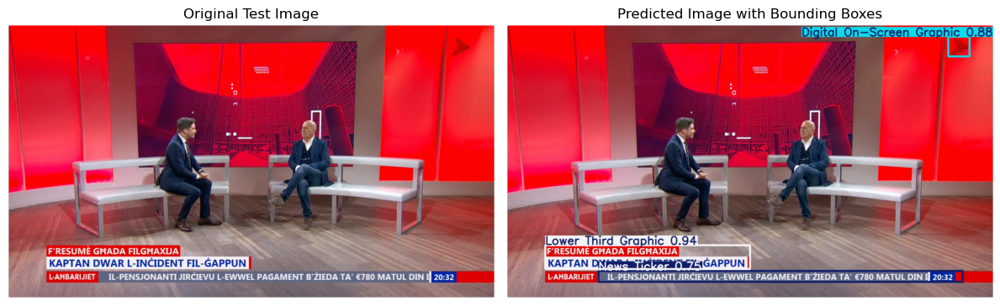


=== Image Analytics ===
Total Objects Detected: 3
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 1
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 1
  - Other News Graphic: 0
Confidence Scores:
  1. Lower Third Graphic - Confidence: 0.94
  2. Digital On-Screen Graphic - Confidence: 0.88
  3. News Ticker - Confidence: 0.75


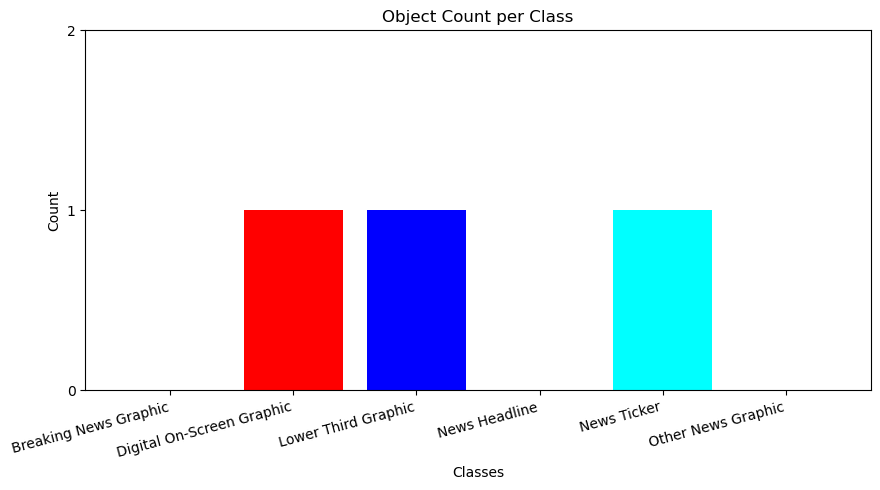

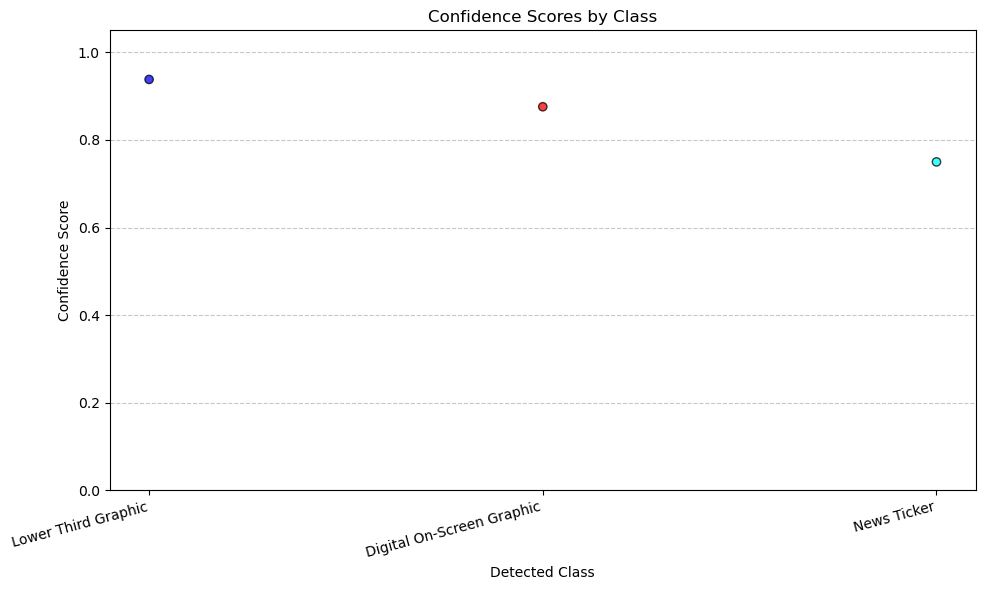

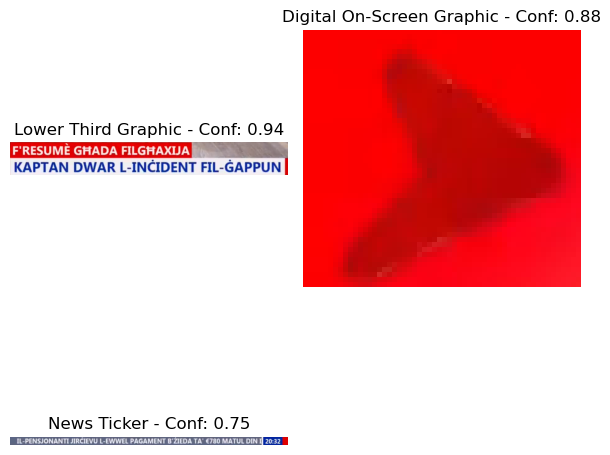


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T15.png

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T15.png: 640x416 1 Digital On-Screen Graphic, 1 News Headline, 1050.2ms
Speed: 173.3ms preprocess, 1050.2ms inference, 672.5ms postprocess per image at shape (1, 3, 640, 416)
Inference time: 1.94 seconds


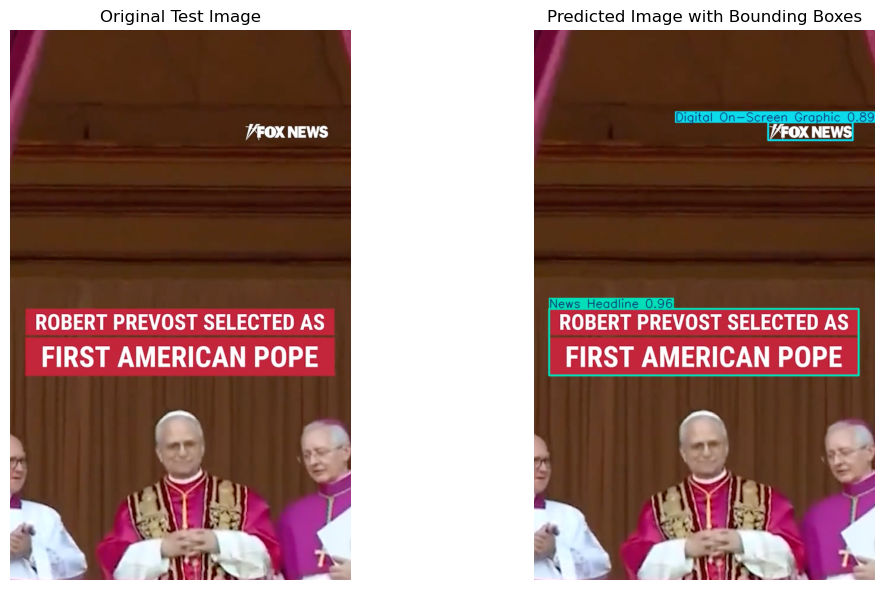


=== Image Analytics ===
Total Objects Detected: 2
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 1
  - Lower Third Graphic: 0
  - News Headline: 1
  - News Ticker: 0
  - Other News Graphic: 0
Confidence Scores:
  1. News Headline - Confidence: 0.96
  2. Digital On-Screen Graphic - Confidence: 0.89


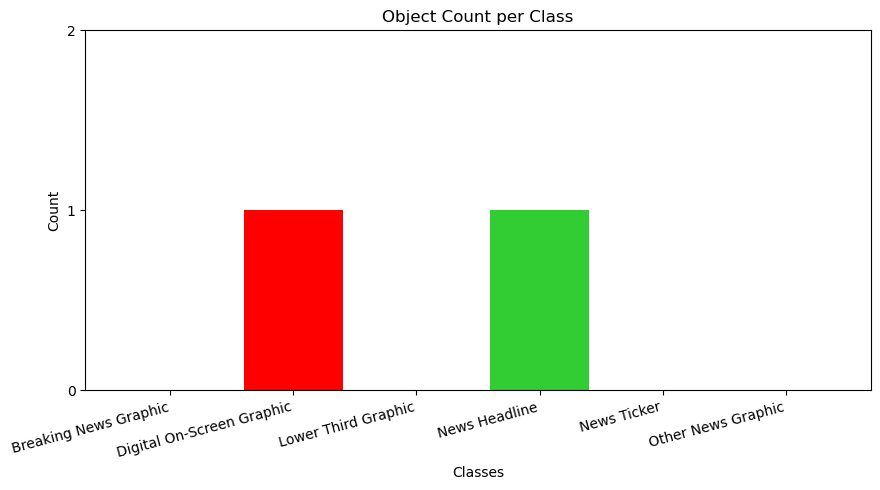

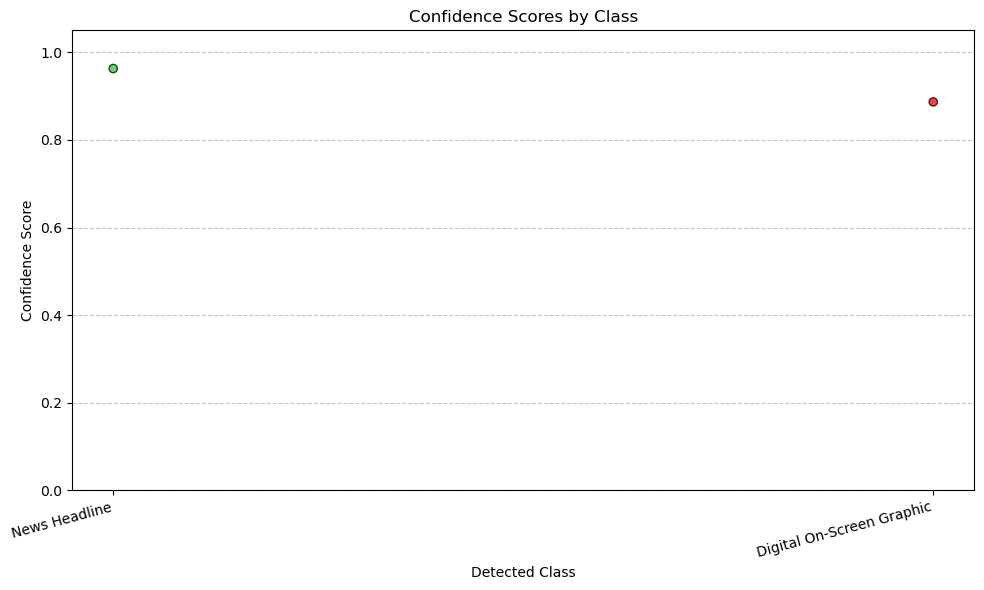

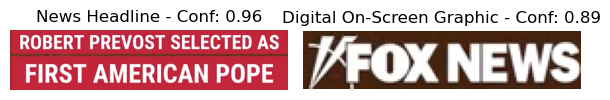


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T2.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T2.jpg: 384x640 1 Breaking News Graphic, 2 Digital On-Screen Graphics, 1 News Ticker, 308.1ms
Speed: 5.5ms preprocess, 308.1ms inference, 32.0ms postprocess per image at shape (1, 3, 384, 640)
Inference time: 0.37 seconds


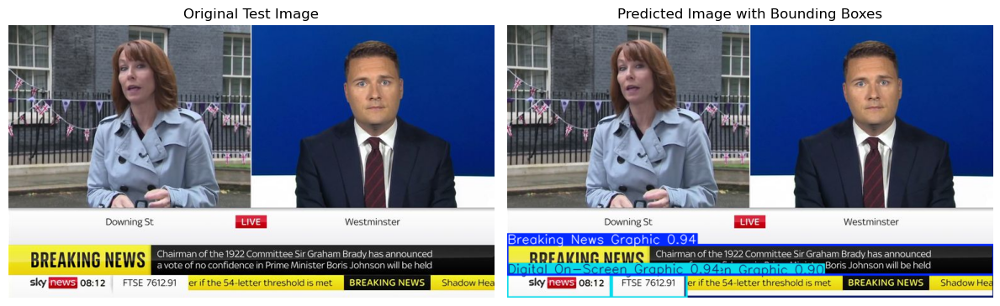


=== Image Analytics ===
Total Objects Detected: 4
Object Breakdown:
  - Breaking News Graphic: 1
  - Digital On-Screen Graphic: 2
  - Lower Third Graphic: 0
  - News Headline: 0
  - News Ticker: 1
  - Other News Graphic: 0
Confidence Scores:
  1. Breaking News Graphic - Confidence: 0.94
  2. Digital On-Screen Graphic - Confidence: 0.94
  3. Digital On-Screen Graphic - Confidence: 0.90
  4. News Ticker - Confidence: 0.89


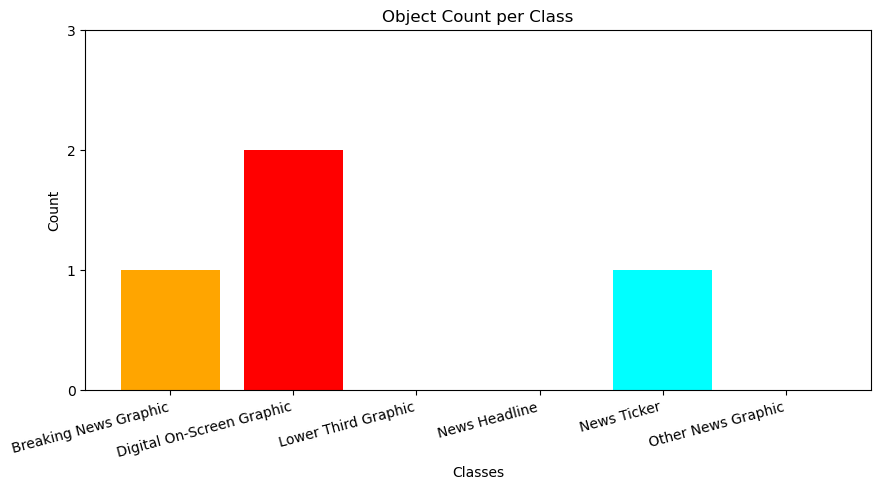

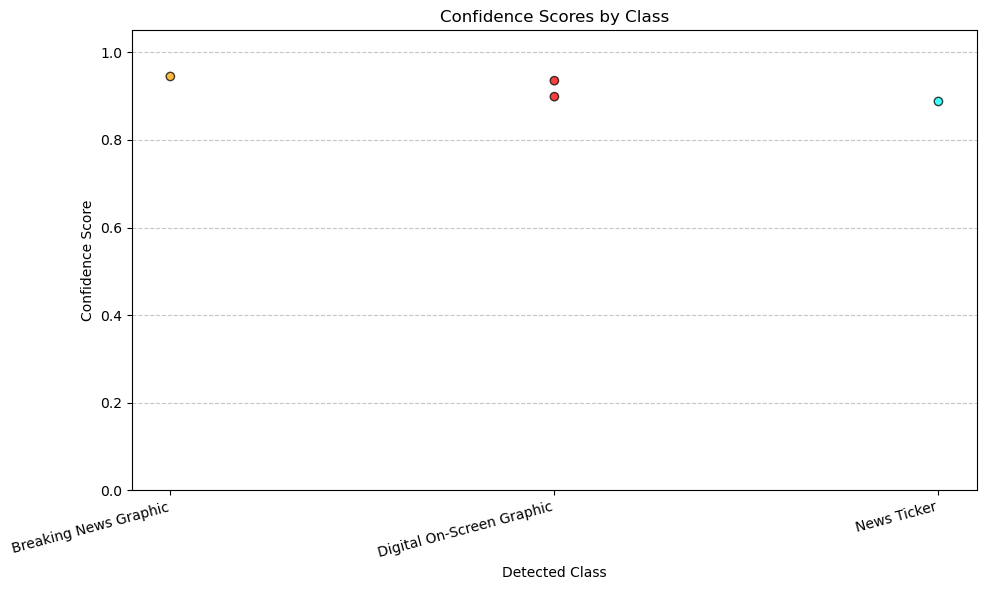

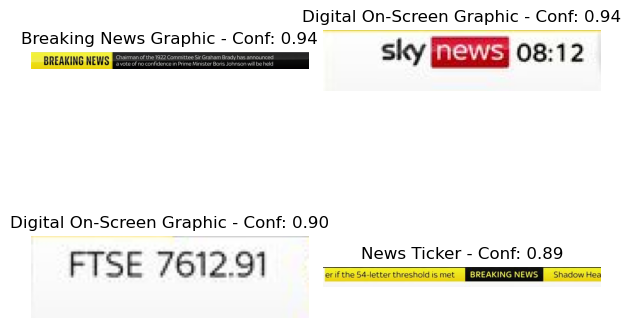


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T3.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T3.jpg: 384x640 1 Breaking News Graphic, 1 Digital On-Screen Graphic, 261.5ms
Speed: 3.3ms preprocess, 261.5ms inference, 34.0ms postprocess per image at shape (1, 3, 384, 640)
Inference time: 0.32 seconds


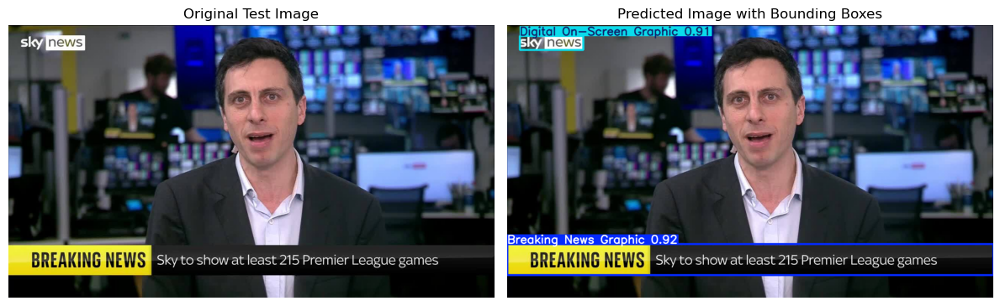


=== Image Analytics ===
Total Objects Detected: 2
Object Breakdown:
  - Breaking News Graphic: 1
  - Digital On-Screen Graphic: 1
  - Lower Third Graphic: 0
  - News Headline: 0
  - News Ticker: 0
  - Other News Graphic: 0
Confidence Scores:
  1. Breaking News Graphic - Confidence: 0.92
  2. Digital On-Screen Graphic - Confidence: 0.91


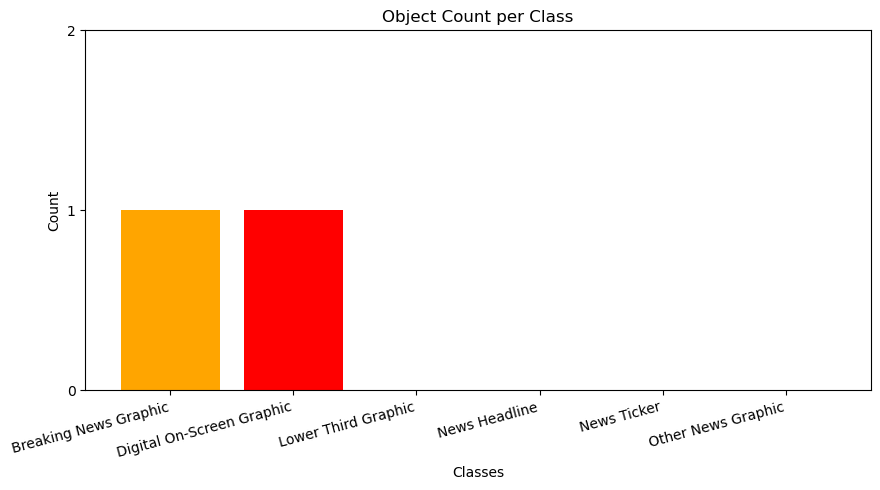

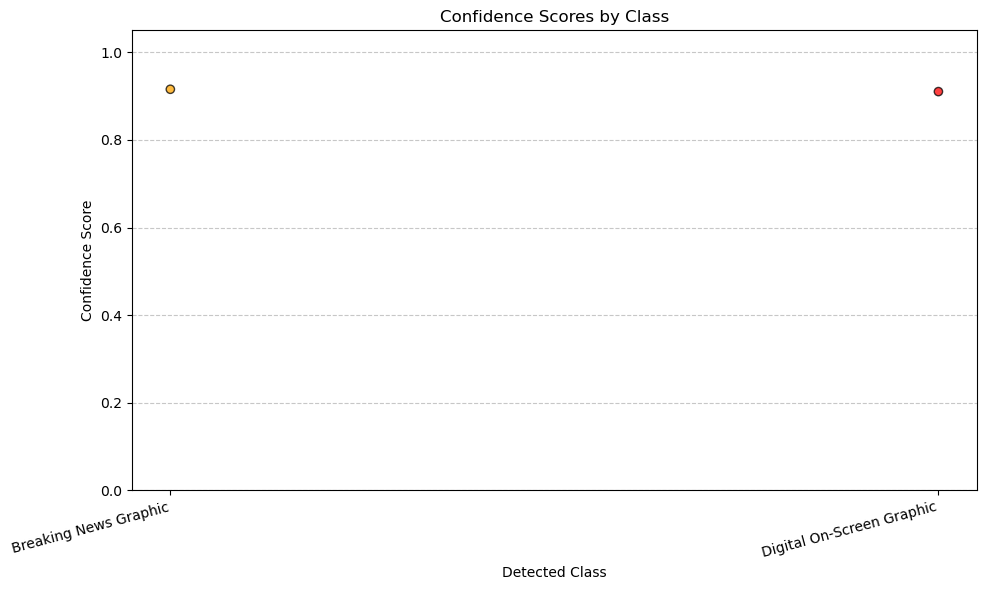

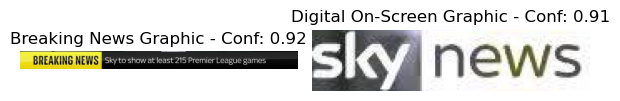


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T5.png

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T5.png: 384x640 1 Digital On-Screen Graphic, 1 Lower Third Graphic, 2 News Tickers, 280.0ms
Speed: 11.3ms preprocess, 280.0ms inference, 37.3ms postprocess per image at shape (1, 3, 384, 640)
Inference time: 0.37 seconds


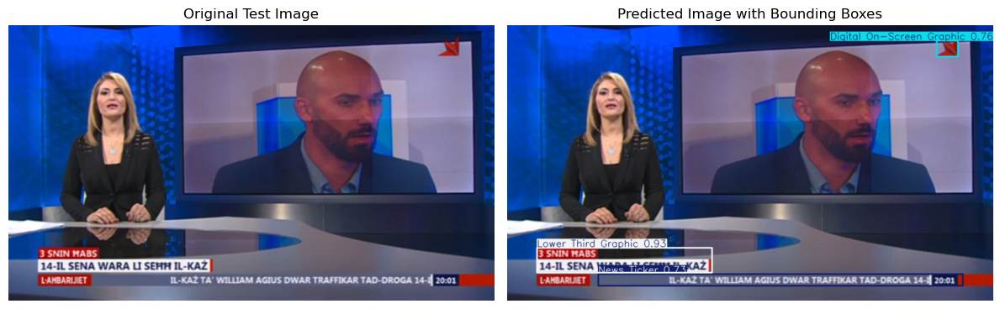


=== Image Analytics ===
Total Objects Detected: 3
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 1
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 1
  - Other News Graphic: 0
Confidence Scores:
  1. Lower Third Graphic - Confidence: 0.93
  2. Digital On-Screen Graphic - Confidence: 0.76
  3. News Ticker - Confidence: 0.73


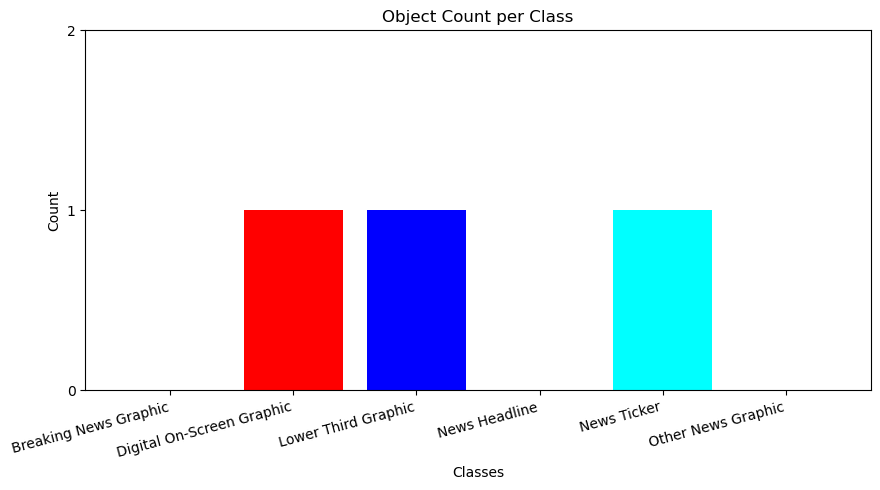

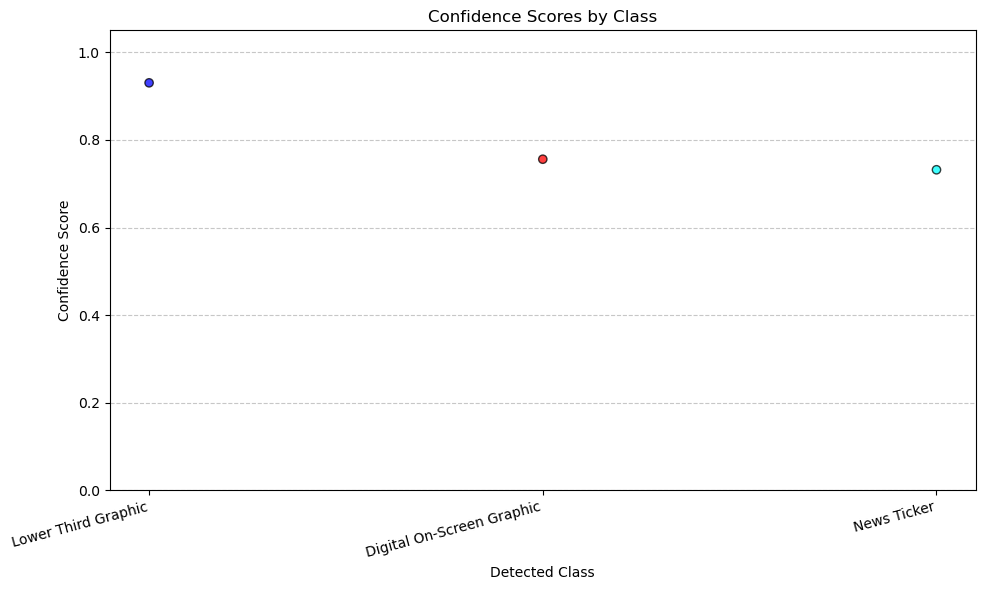

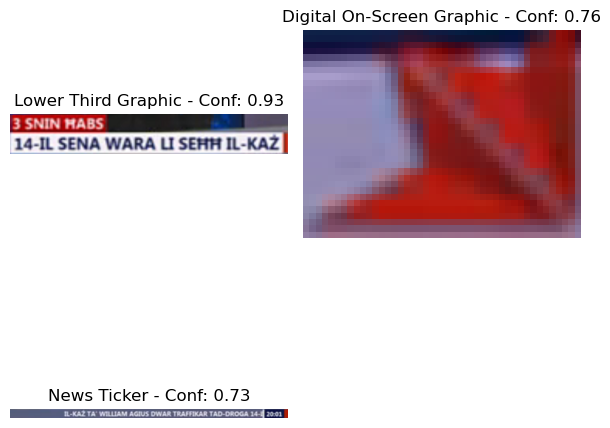


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T6.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T6.jpg: 416x640 1 Lower Third Graphic, 1 News Ticker, 659.2ms
Speed: 14.6ms preprocess, 659.2ms inference, 23.8ms postprocess per image at shape (1, 3, 416, 640)
Inference time: 0.72 seconds


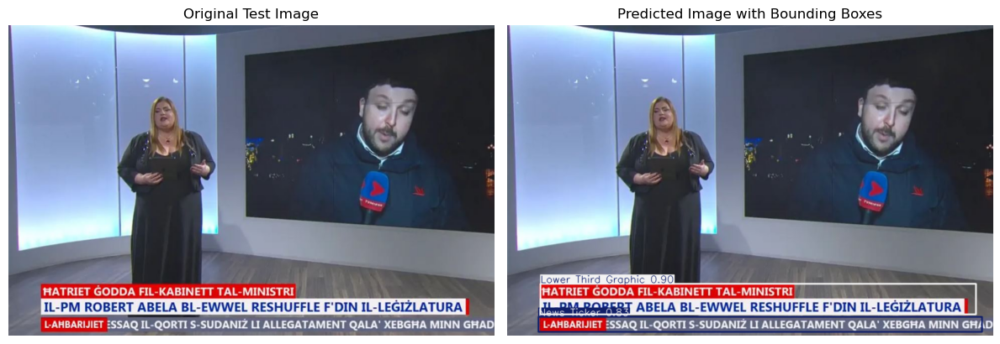


=== Image Analytics ===
Total Objects Detected: 2
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 0
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 1
  - Other News Graphic: 0
Confidence Scores:
  1. Lower Third Graphic - Confidence: 0.90
  2. News Ticker - Confidence: 0.83


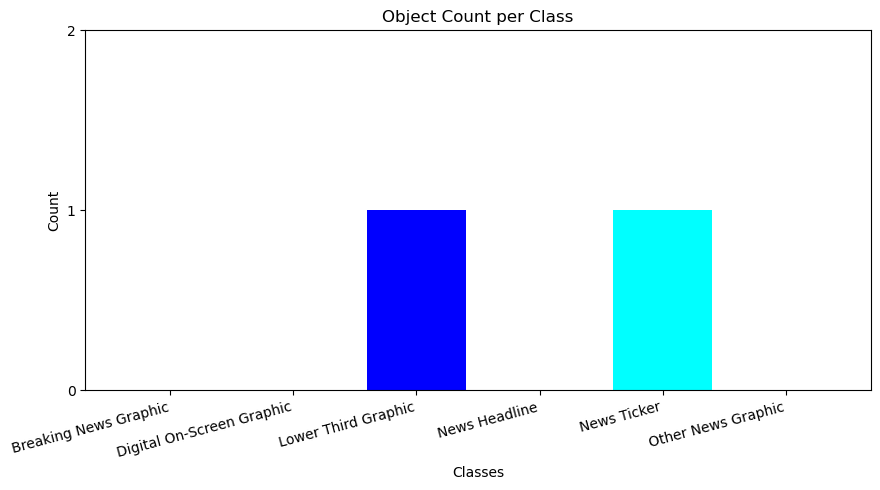

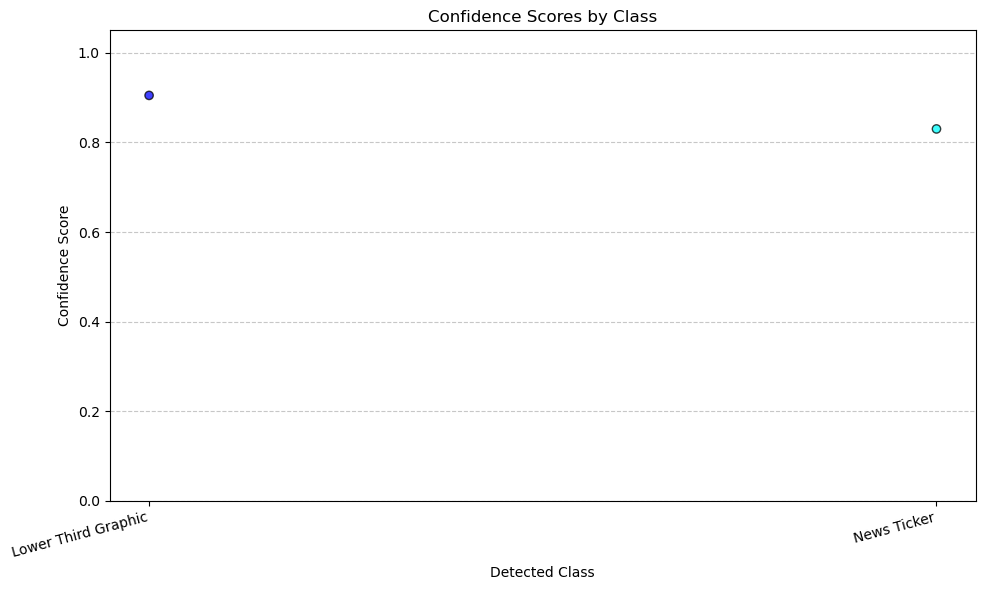

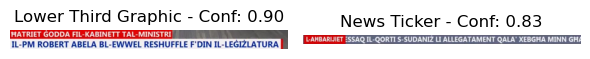


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T7.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T7.jpg: 384x640 1 Lower Third Graphic, 1 Other News Graphic, 484.5ms
Speed: 3.4ms preprocess, 484.5ms inference, 23.9ms postprocess per image at shape (1, 3, 384, 640)
Inference time: 0.53 seconds


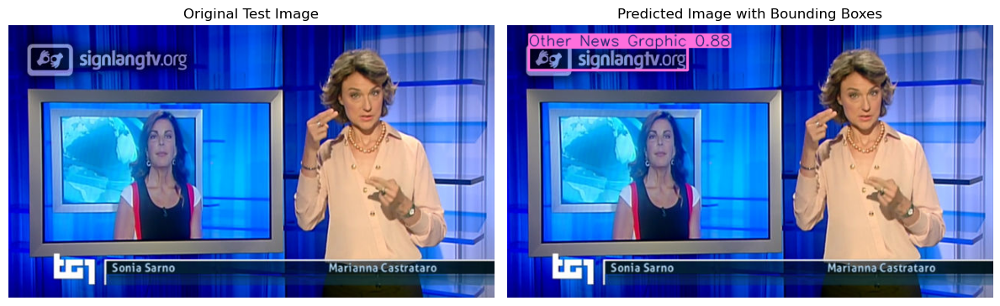


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 0
  - Lower Third Graphic: 0
  - News Headline: 0
  - News Ticker: 0
  - Other News Graphic: 1
Confidence Scores:
  1. Other News Graphic - Confidence: 0.88


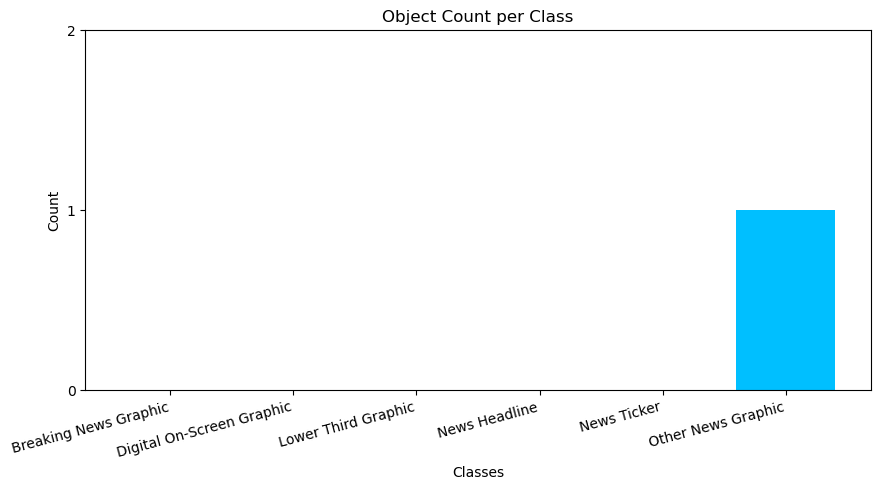

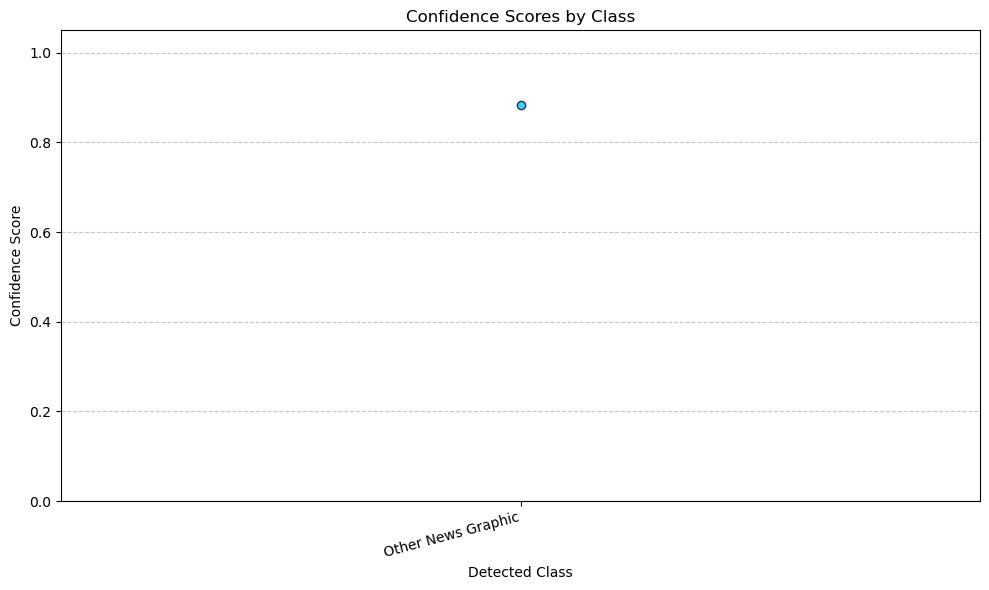

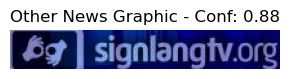


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T8.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T8.jpg: 480x640 1 Lower Third Graphic, 1 Other News Graphic, 1309.7ms
Speed: 7.2ms preprocess, 1309.7ms inference, 81.2ms postprocess per image at shape (1, 3, 480, 640)
Inference time: 1.42 seconds


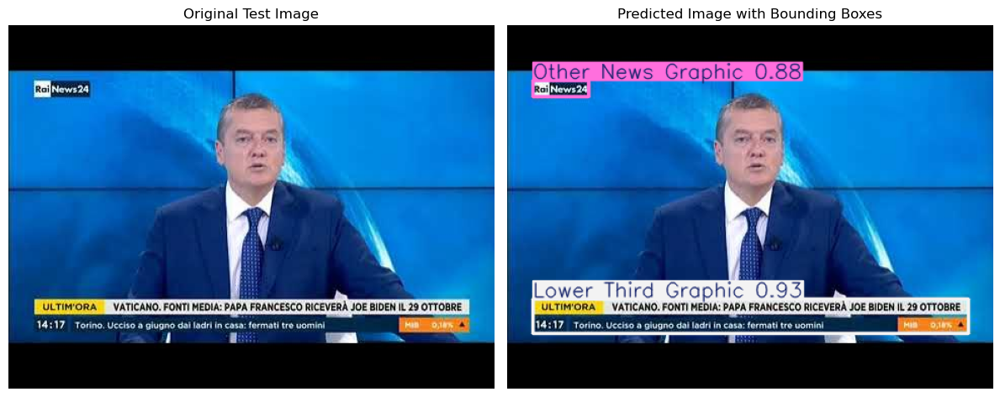


=== Image Analytics ===
Total Objects Detected: 2
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 0
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 0
  - Other News Graphic: 1
Confidence Scores:
  1. Lower Third Graphic - Confidence: 0.93
  2. Other News Graphic - Confidence: 0.88


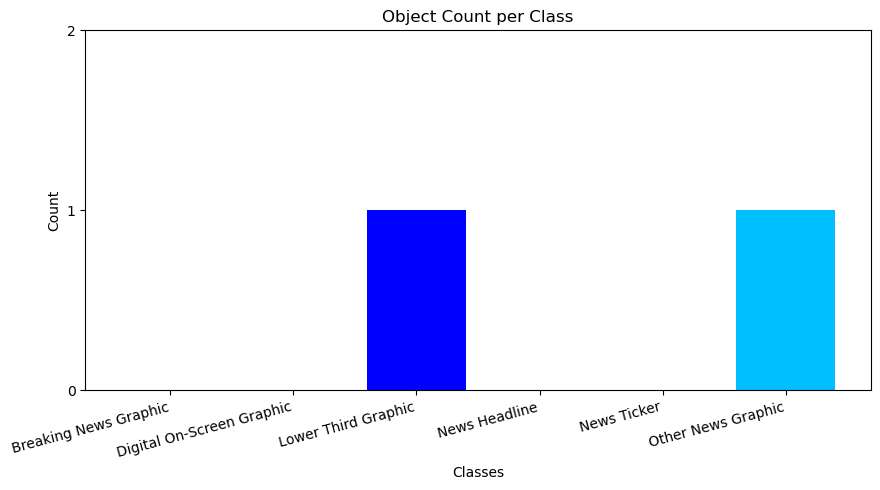

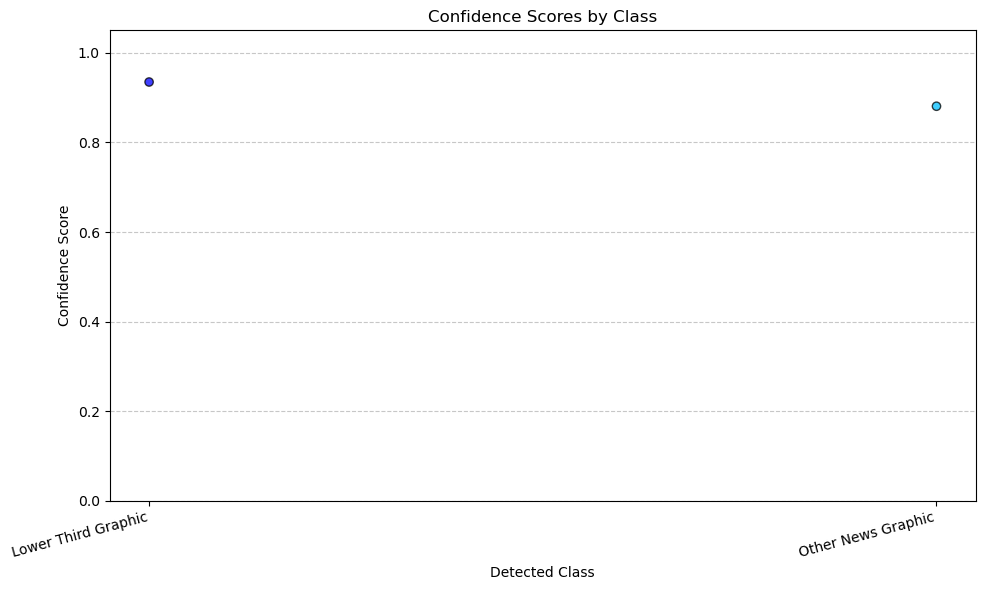

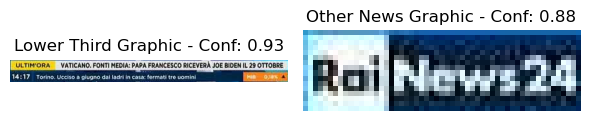


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T10.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T10.jpg: 384x640 2 Digital On-Screen Graphics, 1 Lower Third Graphic, 1 News Ticker, 637.4ms
Speed: 11.9ms preprocess, 637.4ms inference, 44.7ms postprocess per image at shape (1, 3, 384, 640)
Inference time: 0.74 seconds


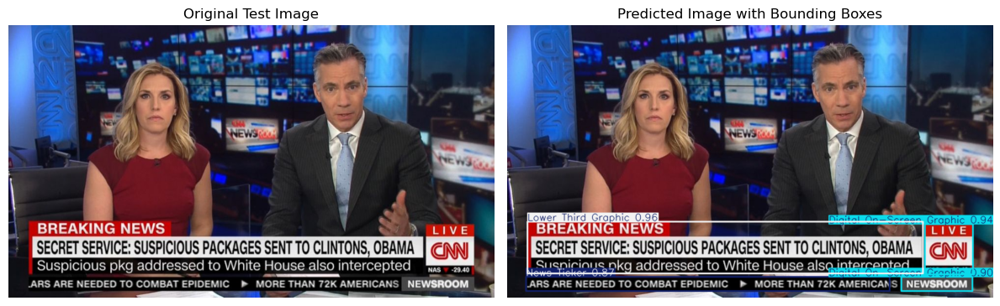


=== Image Analytics ===
Total Objects Detected: 4
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 2
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 1
  - Other News Graphic: 0
Confidence Scores:
  1. Lower Third Graphic - Confidence: 0.96
  2. Digital On-Screen Graphic - Confidence: 0.94
  3. Digital On-Screen Graphic - Confidence: 0.90
  4. News Ticker - Confidence: 0.87


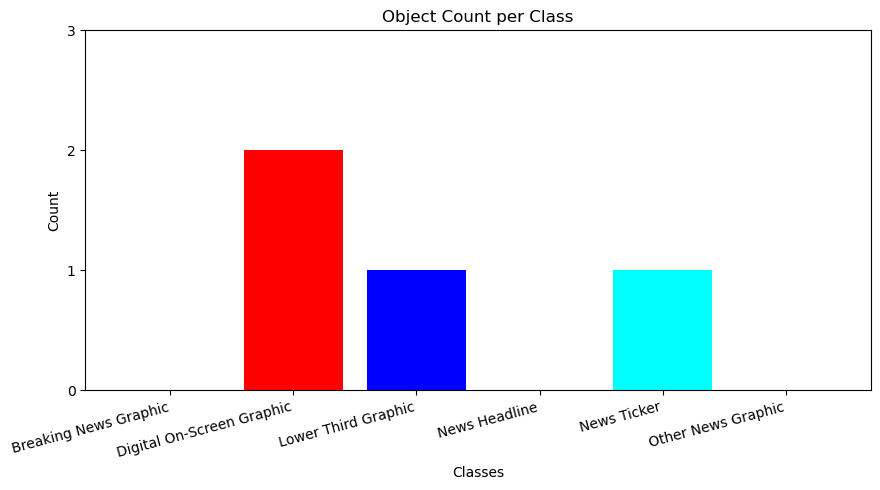

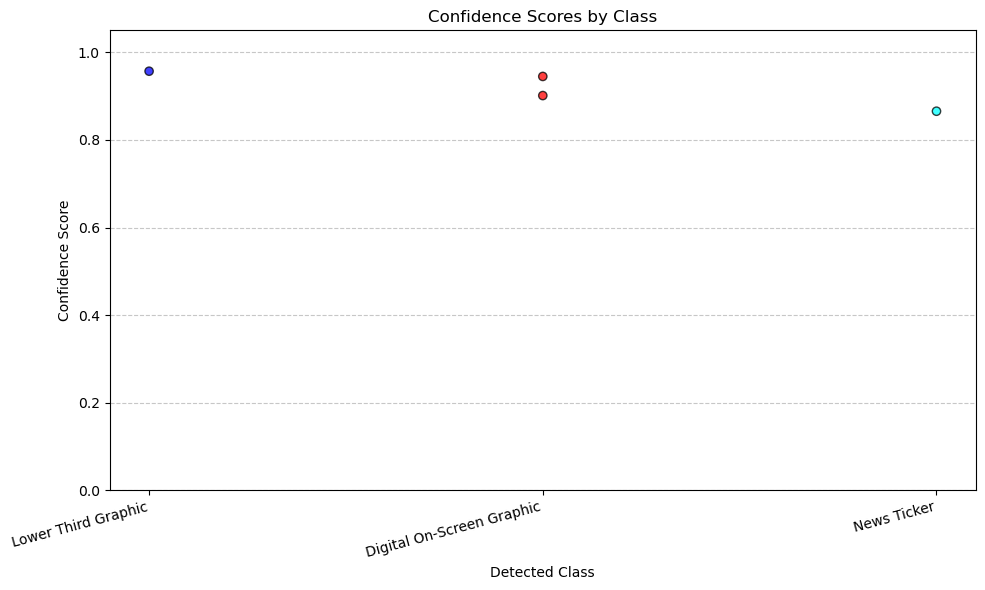

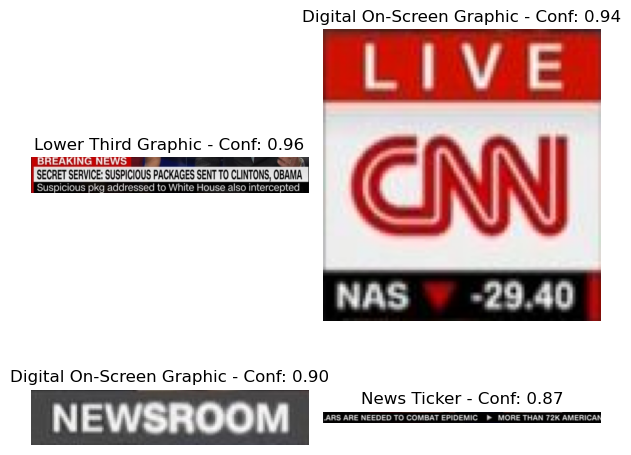


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T11.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T11.jpg: 640x448 2 Digital On-Screen Graphics, 1 Lower Third Graphic, 348.8ms
Speed: 8.5ms preprocess, 348.8ms inference, 40.5ms postprocess per image at shape (1, 3, 640, 448)
Inference time: 0.41 seconds


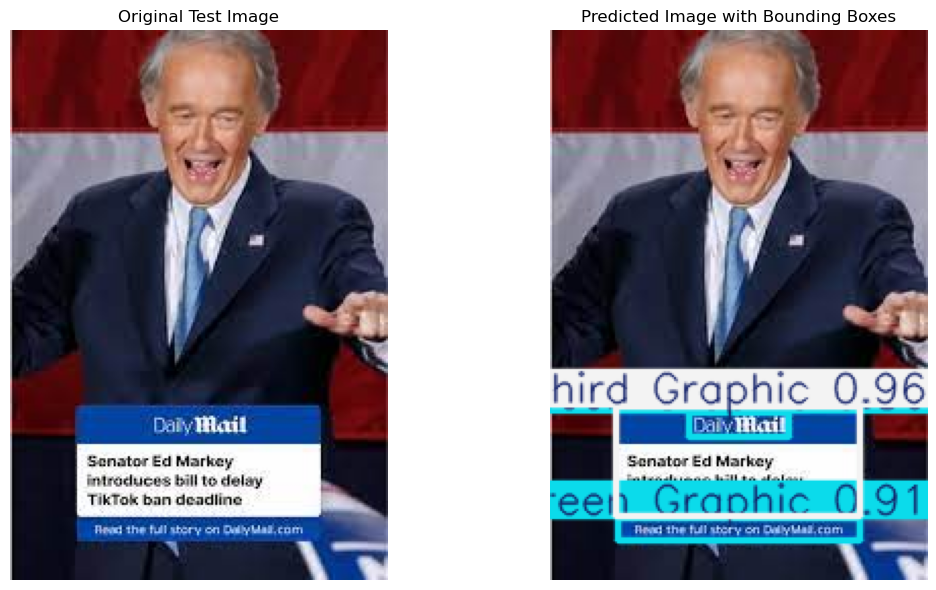


=== Image Analytics ===
Total Objects Detected: 3
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 2
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 0
  - Other News Graphic: 0
Confidence Scores:
  1. Lower Third Graphic - Confidence: 0.96
  2. Digital On-Screen Graphic - Confidence: 0.91
  3. Digital On-Screen Graphic - Confidence: 0.86


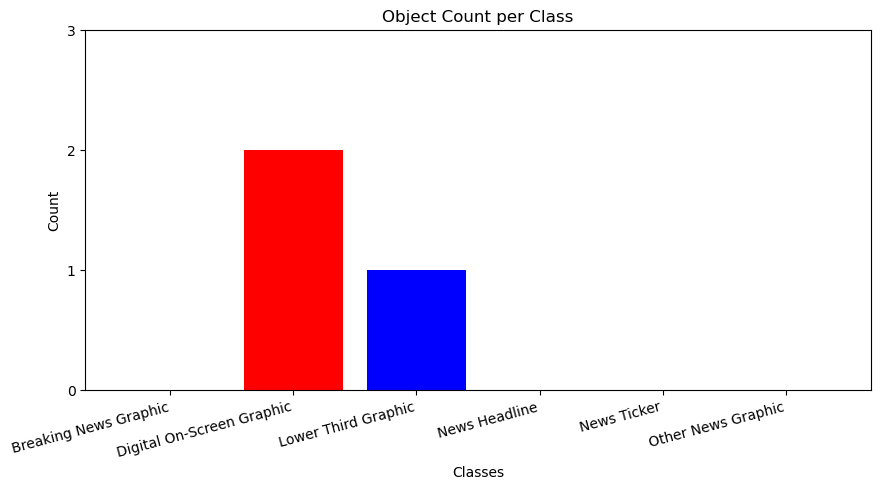

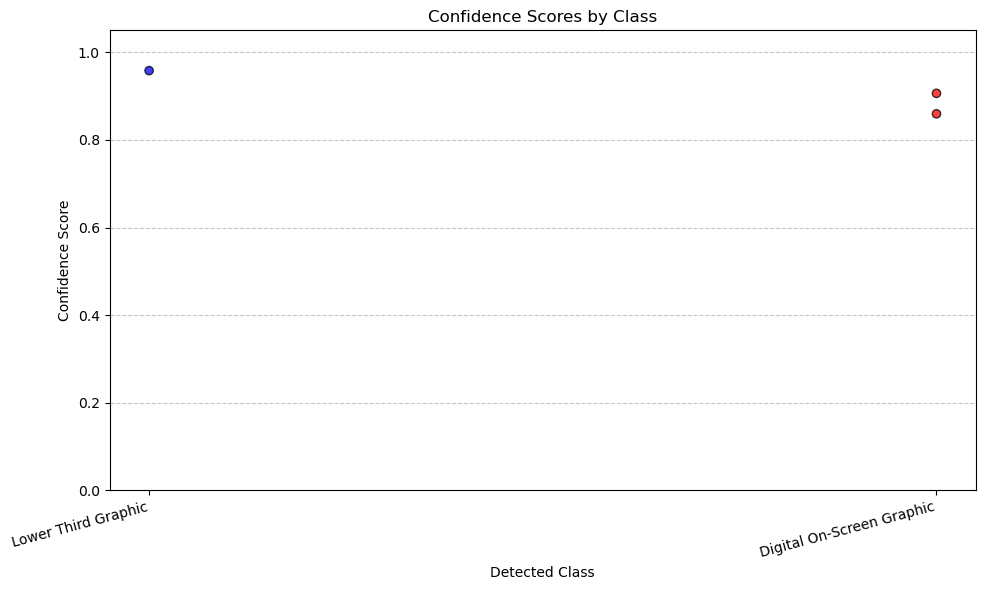

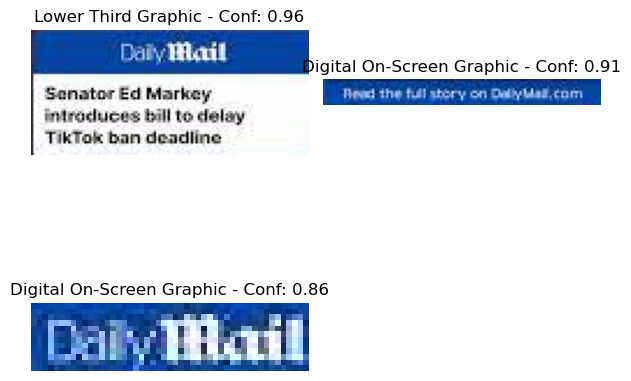


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T12.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T12.jpg: 384x640 1 Lower Third Graphic, 240.1ms
Speed: 5.1ms preprocess, 240.1ms inference, 27.0ms postprocess per image at shape (1, 3, 384, 640)
Inference time: 0.30 seconds


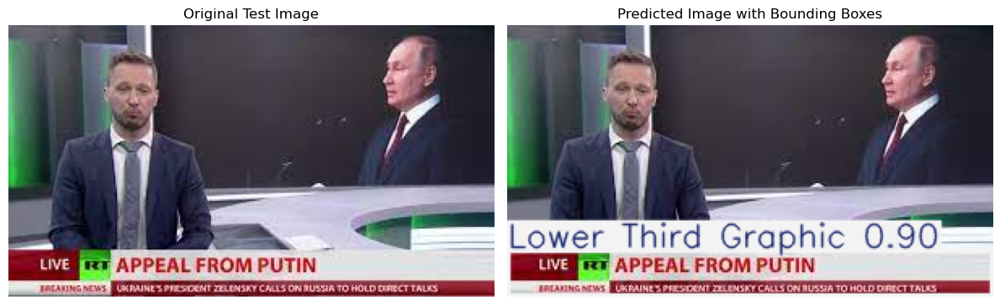


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 0
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 0
  - Other News Graphic: 0
Confidence Scores:
  1. Lower Third Graphic - Confidence: 0.90


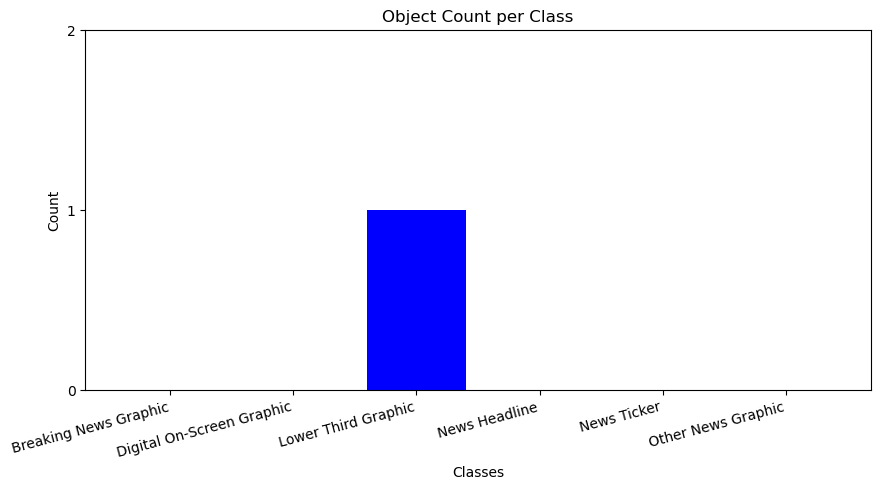

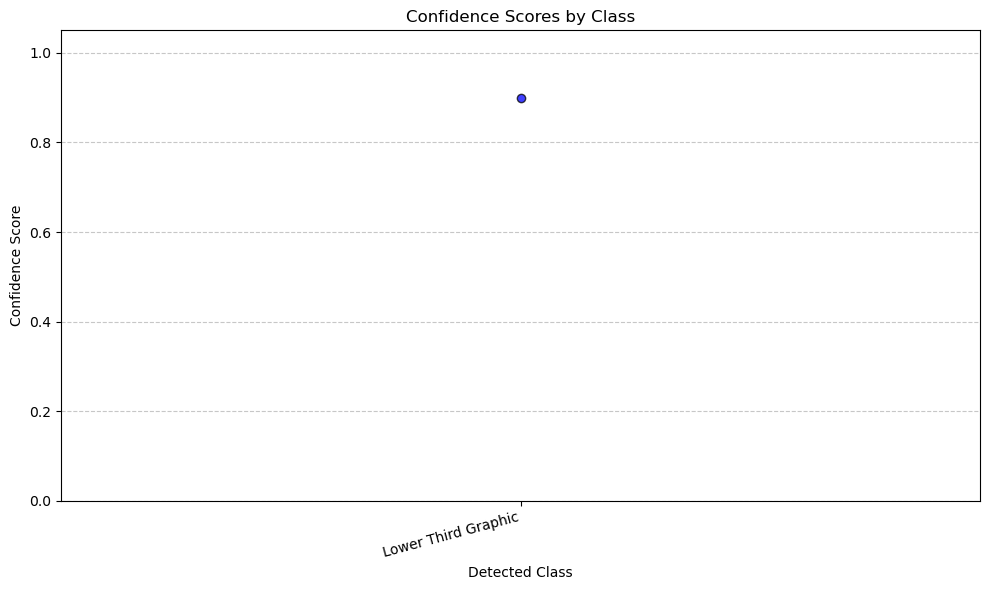

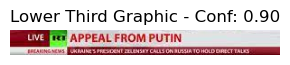


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T4.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T4.jpg: 640x544 (no detections), 600.5ms
Speed: 6.3ms preprocess, 600.5ms inference, 10.6ms postprocess per image at shape (1, 3, 640, 544)
Inference time: 0.63 seconds


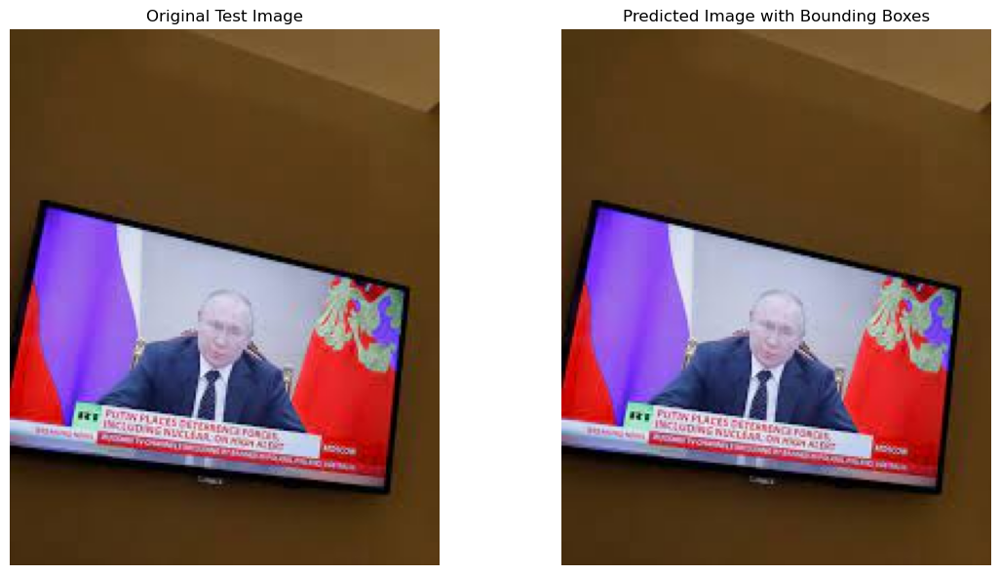

No (0) objects detected in the image.

Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T13.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T13.jpg: 480x640 1 Breaking News Graphic, 4 Digital On-Screen Graphics, 1 Lower Third Graphic, 1 News Ticker, 1 Other News Graphic, 558.5ms
Speed: 18.5ms preprocess, 558.5ms inference, 35.9ms postprocess per image at shape (1, 3, 480, 640)
Inference time: 0.65 seconds


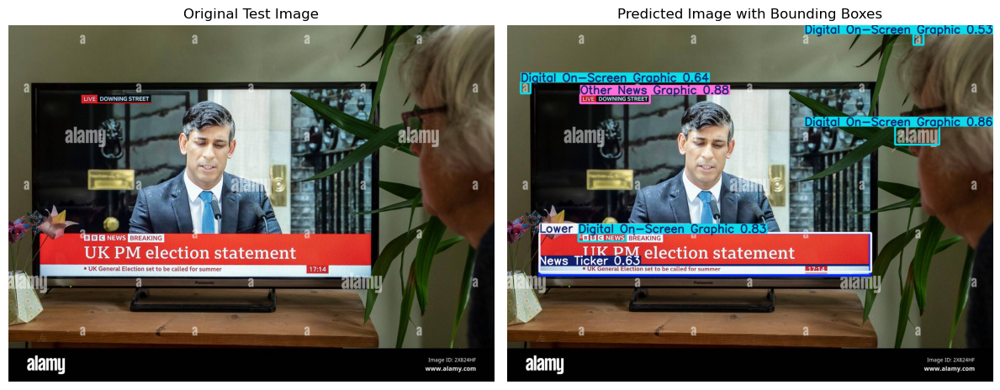


=== Image Analytics ===
Total Objects Detected: 8
Object Breakdown:
  - Breaking News Graphic: 1
  - Digital On-Screen Graphic: 4
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 1
  - Other News Graphic: 1
Confidence Scores:
  1. Other News Graphic - Confidence: 0.88
  2. Digital On-Screen Graphic - Confidence: 0.86
  3. Digital On-Screen Graphic - Confidence: 0.83
  4. Lower Third Graphic - Confidence: 0.75
  5. Breaking News Graphic - Confidence: 0.72
  6. Digital On-Screen Graphic - Confidence: 0.64
  7. News Ticker - Confidence: 0.63
  8. Digital On-Screen Graphic - Confidence: 0.53


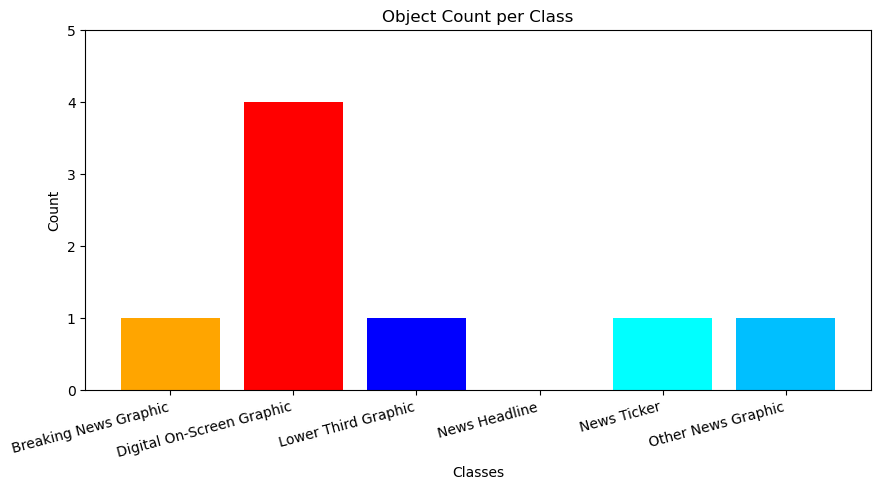

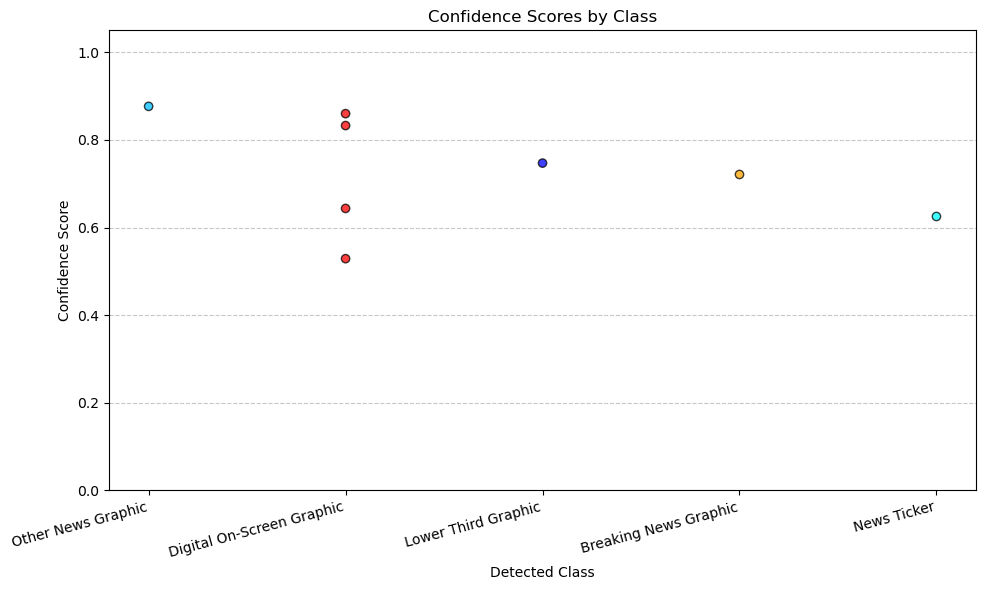

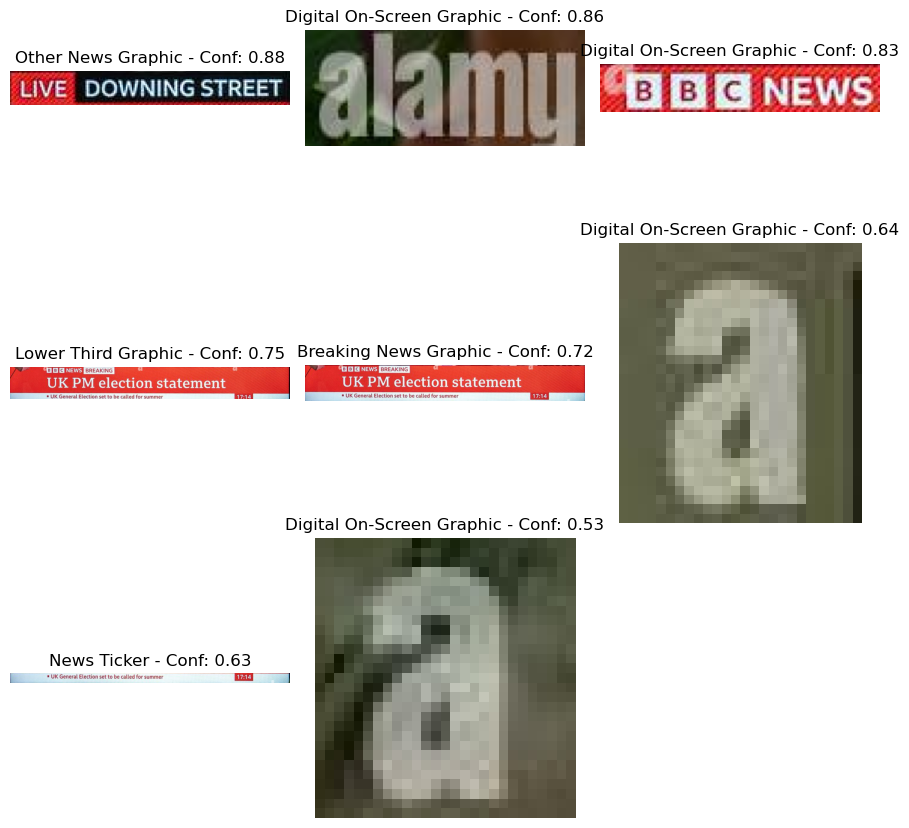


Processing test image: /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T14.jpg

image 1/1 /Volumes/Filis SSD/FYP/Accurate-Name-Extraction/Other/Images/Image_T14.jpg: 384x640 1 Lower Third Graphic, 688.1ms
Speed: 3.6ms preprocess, 688.1ms inference, 18.7ms postprocess per image at shape (1, 3, 384, 640)
Inference time: 0.72 seconds


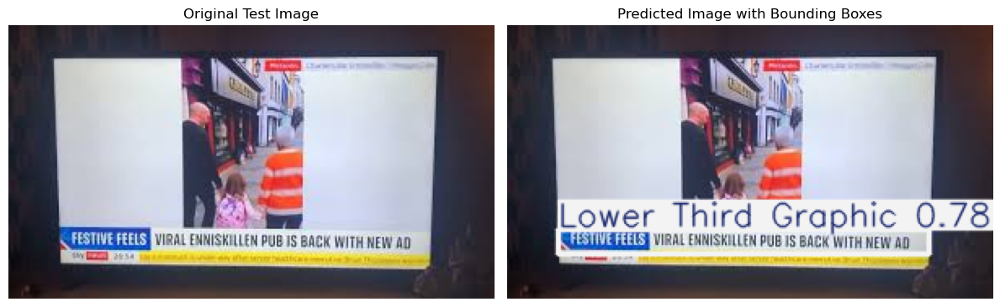


=== Image Analytics ===
Total Objects Detected: 1
Object Breakdown:
  - Breaking News Graphic: 0
  - Digital On-Screen Graphic: 0
  - Lower Third Graphic: 1
  - News Headline: 0
  - News Ticker: 0
  - Other News Graphic: 0
Confidence Scores:
  1. Lower Third Graphic - Confidence: 0.78


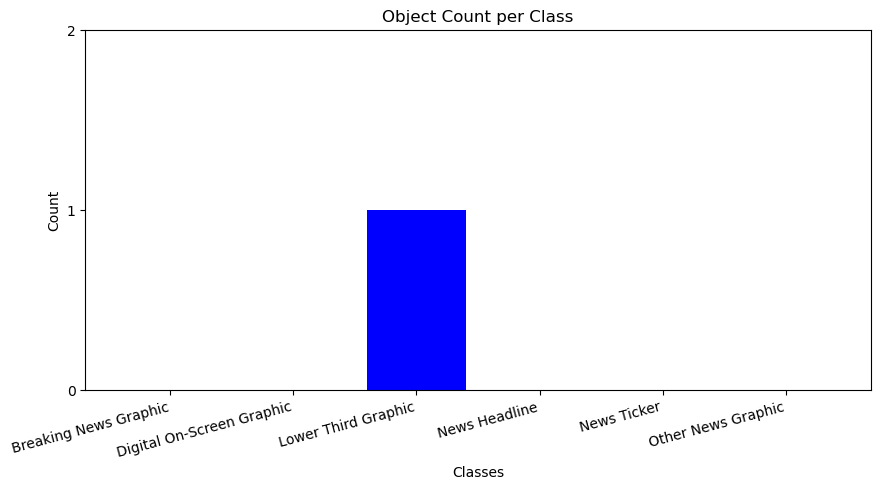

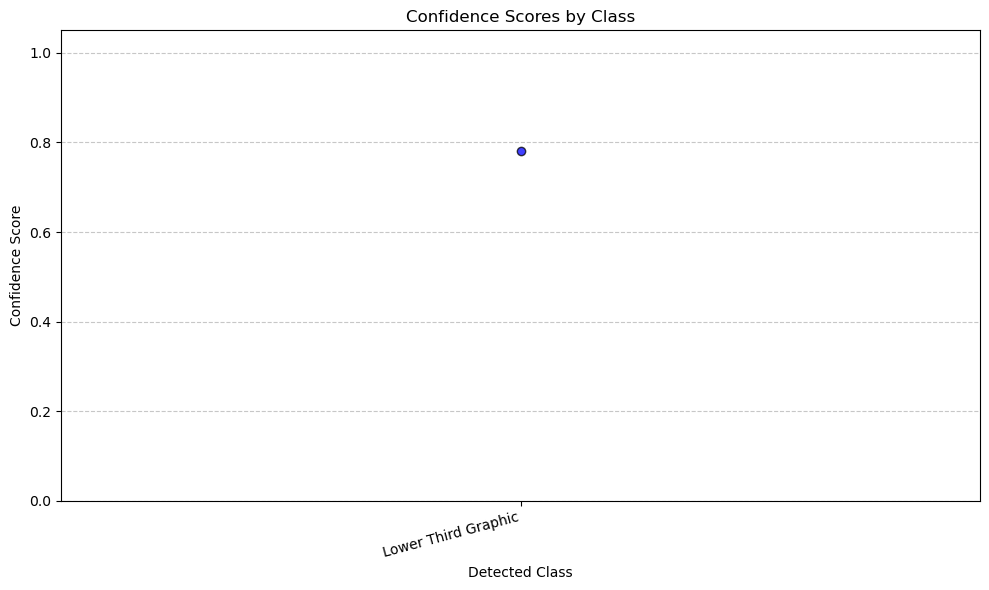

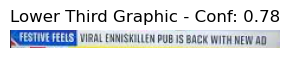

In [20]:
# Path to the selected version's folder
weights_path = os.path.join(os.getcwd(), "runs", "detect", selected_version, "weights", "best.pt")
test_folder_path = os.path.abspath(os.path.join(os.getcwd(), "..", "Other", "Images"))

print(f"Selected weights file: {weights_path}")

# Validate and process all images in the test folder
if not os.path.exists(test_folder_path):
    raise FileNotFoundError(f"Test folder not found at: {test_folder_path}")

test_images = [img for img in os.listdir(test_folder_path) if img.lower().endswith(('.png', '.jpg', '.jpeg'))]
if not test_images:
    raise ValueError(f"No valid image files found in the test folder: {test_folder_path}")

# Determine the device
device = determine_device()  # Ensure this function is defined elsewhere in your code

# Load the YOLO model
model = load_model(weights_path)

# Ensure plots are displayed inline
%matplotlib inline

# Loop through each test image
for test_image in test_images:
    test_image_path = os.path.join(test_folder_path, test_image)
    print(f"\nProcessing test image: {test_image_path}")

    # === Inference time measurement ===
    import time
    start = time.time()
    results = model.predict(source=test_image_path, device=device)
    end = time.time()
    print(f"Inference time: {end - start:.2f} seconds")

    # Load and process the images
    original_image = load_image(test_image_path)  # Ensure this loads the image in RGB

    # Filter out boxes with confidence less than 0.35
    filtered_boxes = results[0].boxes[results[0].boxes.conf > 0.36]

    # Create a copy of results and replace boxes with filtered ones
    results[0].boxes = filtered_boxes

    # Render the filtered results
    predicted_image = cv2.cvtColor(results[0].plot(), cv2.COLOR_BGR2RGB)  # Convert rendered image to RGB

    # Display the original and predicted images side by side
    display_images_side_by_side(original_image, predicted_image, results)

    # Analyze and display detection analytics
    analyze_detections(results, model)

    # Crop and display the detected bounding boxes in a grouped grid
    crop_and_display_boxes_grouped(original_image, results)


## Interpretable AI

Random Image: Image_T6.jpg

🔍 Searching Layer 1 (Conv)

0: 640x640 1 Lower Third Graphic, 151.3ms
Speed: 0.0ms preprocess, 151.3ms inference, 23.3ms postprocess per image at shape (1, 3, 640, 640)


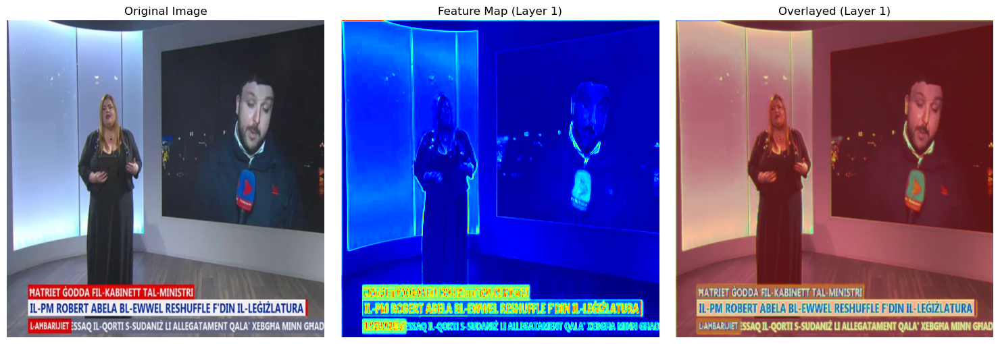


🔍 Searching Layer 2 (Conv)

0: 640x640 1 Lower Third Graphic, 136.0ms
Speed: 0.0ms preprocess, 136.0ms inference, 12.2ms postprocess per image at shape (1, 3, 640, 640)


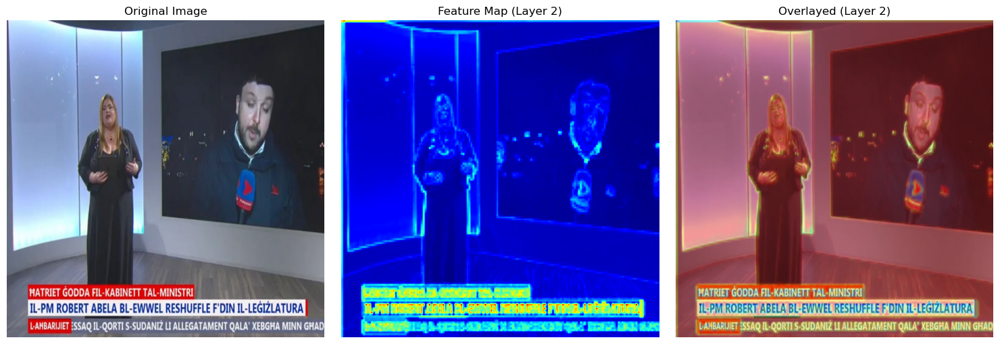


🔍 Searching Layer 3 (C3k2)

0: 640x640 1 Lower Third Graphic, 409.8ms
Speed: 0.0ms preprocess, 409.8ms inference, 137.5ms postprocess per image at shape (1, 3, 640, 640)


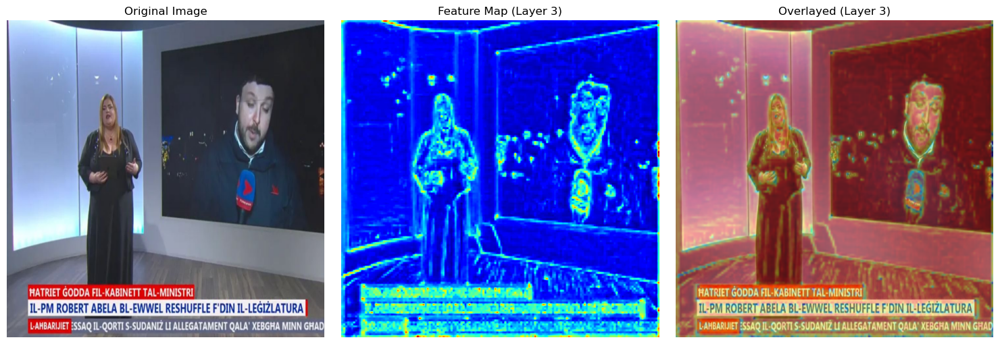


🔍 Searching Layer 4 (Conv)

0: 640x640 1 Lower Third Graphic, 638.5ms
Speed: 0.0ms preprocess, 638.5ms inference, 66.8ms postprocess per image at shape (1, 3, 640, 640)


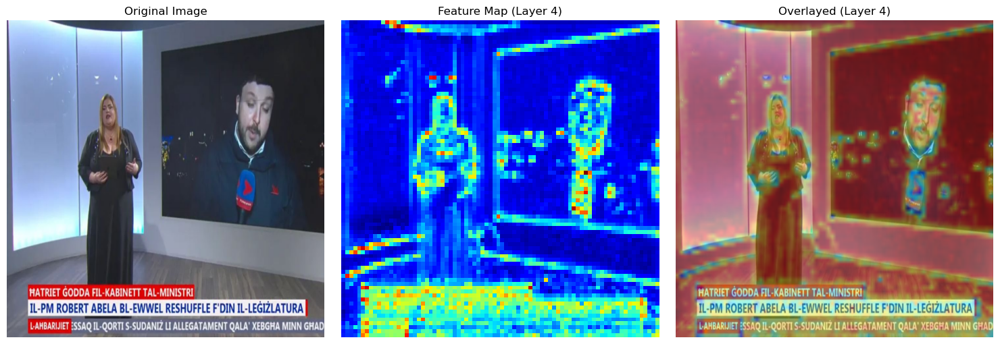

In [31]:
# === Pick random image ===
random_image = random.choice(test_images)
random_image_path = os.path.join(test_folder_path, random_image)
print(f"Random Image: {random_image}")

# === Load and preprocess ===
image_np = load_image(random_image_path)
resized_image = cv2.resize(image_np, (640, 640))
image_tensor = ToTensor()(resized_image).unsqueeze(0).to(device)

# === Get model layers properly ===
target_layers = []

# For YOLOv12 models - try more specific approaches
if hasattr(model, 'model'):
    # Some YOLOv12 versions have different structures
    if hasattr(model.model, 'model'):
        # YOLOv12 structure where backbone is in model.model.model
        for i in [0, 1, 2, 3]:
            if i < len(model.model.model):
                target_layers.append(model.model.model[i])
    elif hasattr(model.model, '_modules'):
        # Try getting modules directly 
        modules = list(model.model._modules.values())
        for i in [1, 2, 3]:
            if i < len(modules):
                target_layers.append(modules[i])
else:
    # More generic approach
    modules = list(model.modules())
    # Skip the first module which is the model itself
    filtered_modules = [m for m in modules[1:] if isinstance(m, (torch.nn.Conv2d, torch.nn.Sequential))]
    for i in [0, 1, 2]:  # Adjust indices since we're using filtered modules
        if i < len(filtered_modules):
            target_layers.append(filtered_modules[i])

# If we still have no layers, use a more general approach
if not target_layers:
    print("Using general module approach...")
    all_modules = list(model.modules())
    # Skip first module (the model itself) and take the next three
    for i, m in enumerate(all_modules[1:4], 1):
        target_layers.append(m)
        print(f"Adding module {i}: {type(m).__name__}")

# === Loop through obtained layers ===
for layer_idx, target_layer in enumerate(target_layers, 1):
    print(f"\n🔍 Searching Layer {layer_idx} ({type(target_layer).__name__})")

    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output
        return hook

    handle = target_layer.register_forward_hook(get_activation('target'))

    with torch.no_grad():
        _ = model(image_tensor)
    handle.remove()

    feature_map = activation.get('target')
    if isinstance(feature_map, (tuple, list)):
        feature_map = feature_map[0]
    if not isinstance(feature_map, torch.Tensor):
        print("Skipped: Not a tensor")
        continue

    if feature_map.dim() == 4:
        feature_map = feature_map[0].mean(0)
    else:
        feature_map = feature_map.mean(0)

    feature_map = feature_map.cpu().numpy()
    feature_map = (feature_map - feature_map.min()) / (feature_map.max() - feature_map.min() + 1e-8)
    heatmap = cv2.applyColorMap(np.uint8(255 * feature_map), cv2.COLORMAP_JET)
    heatmap = cv2.resize(heatmap, (640, 640))
    overlayed = cv2.addWeighted(resized_image, 0.6, heatmap, 0.4, 0)

    # === Show the result ===
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(resized_image)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    ax[1].imshow(feature_map, cmap='jet')
    ax[1].set_title(f"Feature Map (Layer {layer_idx})")
    ax[1].axis("off")

    ax[2].imshow(overlayed)
    ax[2].set_title(f"Overlayed (Layer {layer_idx})")
    ax[2].axis("off")

    plt.tight_layout()
    plt.show()